# Harpy - Xenium - Initial analysis

In this series of notebooks, we will analyze a 10X Genomics [Xenium](https://www.10xgenomics.com/platforms/xenium) dataset using the [Harpy](https://harpy.readthedocs.io/en/latest/) package. A Python package that allows flexible, modular and scalable analysis of spatial omics datasets. The package includes tools for image processing, cell segmentation, transcript allocation and cell type annotation. We will also explore the Xenium dataset itself, introduce the SpatialData data format and how you can plot spatial data, and go over some additional analysis options, including segmentation-free approaches and downstream analysis steps.

When you make use of Harpy for analysis of spatial transcriptomics data, please cite [Pollaris et al. (2024)](https://www.biorxiv.org/content/biorxiv/early/2024/07/06/2024.07.04.601829.full.pdf), if you use Harpy for proteomics, please cite [Rombaut et al. (2026)](https://academic.oup.com/bioinformatics/article/42/3/btag122/8519620?login=false).

Below, we analyze a 4,000 × 4,000 pixel subset of the original dataset.

For a a compact end-to-end analysis of a 10,000 × 10,000 pixel subset of this dataset, including segmentation, transcript allocation, and basic downstream analysis see [this tutorial](https://harpy.readthedocs.io/en/latest/tutorials/general/Harpy_xenium_transcriptomics_subset.html).

For results on the complete dataset see [this tutorial](https://harpy.readthedocs.io/en/latest/tutorials/advanced/Harpy_transcriptomics_xenium.html).

## Import packages

In [1]:
import geopandas as gpd
import harpy as hp
import matplotlib.pyplot as plt
import scanpy as sc
import spatialdata_plot

_ = spatialdata_plot

## Read SpatialData

In [2]:
import tempfile
from pathlib import Path

from harpy.datasets.registry import get_registry
from spatialdata import read_zarr

path = None  # change this on windows

tmp = tempfile.TemporaryDirectory(prefix="xenium_")
output_dir = Path(tmp.name)

sdata = hp.datasets.xenium_human_ovarian_cancer_course(
    checkpoint="checkpoint_1",
    path=path,
)

sdata.write(output_dir / "sdata.zarr", overwrite=True)

sdata = read_zarr(sdata.path)

registry = get_registry(path=path)
# Lets add the region annotations.
paths_to_GeoJSONs = {
    "tumor": registry.fetch(
        "transcriptomics/xenium/Xenium_human_ovarian_cancer/training_march_2026/tumor.geojson"
    ),
    "necrosis": registry.fetch(
        "transcriptomics/xenium/Xenium_human_ovarian_cancer/training_march_2026/necrosis.geojson"
    ),
    "ovary": registry.fetch(
        "transcriptomics/xenium/Xenium_human_ovarian_cancer/training_march_2026/ovary.geojson"
    ),
    "fallopian_tube": registry.fetch(
        "transcriptomics/xenium/Xenium_human_ovarian_cancer/training_march_2026/fallopian_tube.geojson"
    ),
    "smooth_muscle": registry.fetch(
        "transcriptomics/xenium/Xenium_human_ovarian_cancer/training_march_2026/smooth_muscle.geojson"
    ),
}

for name, path in paths_to_GeoJSONs.items():
    gdf_regions = gpd.read_file(path)
    sdata = hp.sh.add_shapes(
        sdata, input=gdf_regions, output_shapes_name=name, overwrite=True
    )

# and add the vectorized segmentation mask from xenium
sdata = hp.sh.vectorize(
    sdata,
    labels_name="nucleus_labels_global",
    output_shapes_name="nucleus_shapes_global",
    overwrite=True,
)

sdata = hp.sh.vectorize(
    sdata,
    labels_name="cell_labels_global",
    output_shapes_name="cell_shapes_global",
    overwrite=True,
)

/Users/arne.defauw/.local/share/uv/python/cpython-3.12.12-macos-aarch64-none/lib/python3.12/functools.py:912: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)
/Users/arne.defauw/.local/share/uv/python/cpython-3.12.12-macos-aarch64-none/lib/python3.12/contextlib.py:137: UserWarning: zarr v3 autosharding will be the default in the next minor release.
  return next(self.gen)
/Users/arne.defauw/.local/share/uv/python/cpython-3.12.12-macos-aarch64-none/lib/python3.12/contextlib.py:137: UserWarning: zarr v3 autosharding will be the default in the next minor release.
  return next(self.gen)
/Users/arne.defauw/.local/share/uv/python/cpython-3.12.12-macos-aarch64-none/lib/python3.12/contextlib.py:137: UserWarning: zarr v3 autosharding will be the default in the next minor release.
  return next(self.gen)
/Users/arne.defauw/.local/share/uv/python/cpython-3.12.12-macos-aarch64-none/lib/python3.12/contextlib.py:137: UserWarning: zarr v3 auto

## 6. Image preprocessing
To improve segmentation quality, we have several options to first preprocess the images to improve the quality, contrast, remove background, etc. This can help to get much better segmentation masks, but note that in many cases (depending on the exact combination of image quality, tissue type and segmentation model), we can safely skip this step and get good results with just the raw images.

### 6.1 Tiling correction and inpainting

<b>Tiling correction</b>: For some imaging-based spatial transcriptomics technologies (such as Molecular Cartography), uneven illumination during image acquisition results in artifacts that can influence the downstream analysis (e.g. segmentation). Harpy's tiling_correction function can be used to correct for this uneven illumination (using BaSiC on the back-end).

<b>Inpainting</b>: For Molecular Cartography and CosMx, there are black lines at the border between tiles and these can causing incorrect segmentation of cells. The tiling_correction function can correct for these black lines by using OpenCV's inpainting. 

We have not found this step to be necessary for most technologies (Xenium, Merscope, ...), but you should plot the image to check whether you need this preprocessing step for your data. 

To use hp.im.tiling_correction(), make sure `jax` and `basicpy` are installed as described in the [documentation](https://harpy.readthedocs.io/en/latest/installation.html).

In [3]:
sdata

SpatialData object, with associated Zarr store: /private/var/folders/sz/t3tgg4fs4tz9btm0fbqg_tzc0000gn/T/xenium__en2vp3a/sdata.zarr
├── Images
│     ├── 'he_image_global': DataTree[cyx] (3, 3128, 3128), (3, 1564, 1564), (3, 782, 782), (3, 391, 391), (3, 195, 195), (3, 97, 97), (3, 48, 48)
│     └── 'morphology_focus_global': DataTree[cyx] (4, 4000, 4000), (4, 2000, 2000), (4, 1000, 1000), (4, 500, 500), (4, 250, 250), (4, 125, 125), (4, 62, 62)
├── Labels
│     ├── 'cell_labels_global': DataTree[yx] (4000, 4000), (2000, 2000), (1000, 1000), (500, 500), (250, 250), (125, 125), (62, 62)
│     └── 'nucleus_labels_global': DataTree[yx] (4000, 4000), (2000, 2000), (1000, 1000), (500, 500), (250, 250), (125, 125), (62, 62)
├── Points
│     └── 'transcripts_global': DataFrame with shape: (<Delayed>, 3) (2D points)
├── Shapes
│     ├── 'cell_shapes_global': GeoDataFrame shape: (6079, 1) (2D shapes)
│     ├── 'fallopian_tube': GeoDataFrame shape: (1, 3) (2D shapes)
│     ├── 'necrosis': GeoData

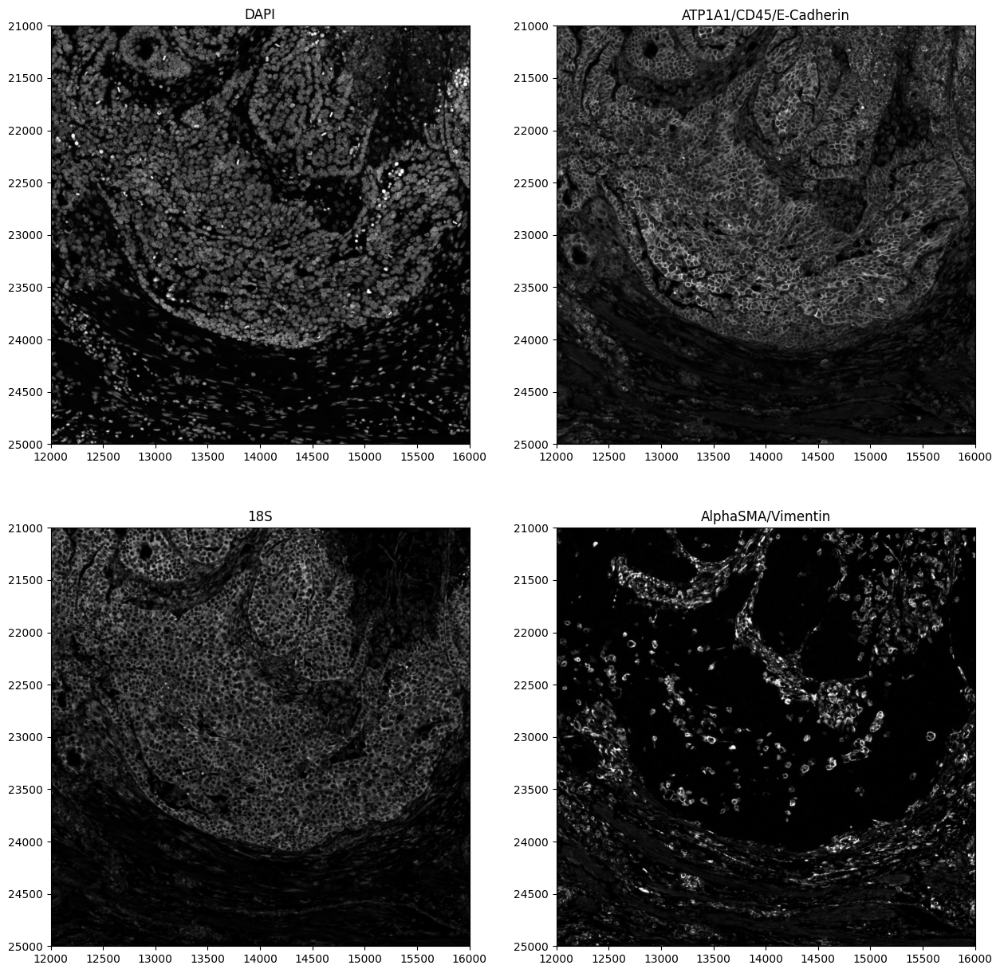

In [4]:
# First, we check whether we need any tiling correction by plotting images
from matplotlib.colors import Normalize

channels = [
    "DAPI",
    "ATP1A1/CD45/E-Cadherin",
    "18S",
    "AlphaSMA/Vimentin",
]

fig, axes = plt.subplots(2, 2, figsize=(15, 15))

for ax, channel in zip(axes.ravel(), channels):
    norm = Normalize(vmin=0, vmax=5000)

    sdata.pl.render_images(
        element="morphology_focus_global", channel=channel, cmap="gray", norm=norm
    ).pl.show(coordinate_systems="global", title=channel, colorbar=False, ax=ax)

In [5]:
# Since we do not see any tiling artifacts (black lines, uneven illumination), we do not need to apply tiling correction. Therefore, the code is commented out.

"""
sdata, flatfields = hp.im.tiling_correction(
    sdata = sdata,
    img_name = "morphology_focus_global",
    tile_size = 2144, # You need to supply the tile size that was used during acquisition. For Molecular Cartography datasets, the tile size is 2144.
    output_image_name = "tiling_correction",
    crd = None,
    overwrite=True,
)
"""

'\nsdata, flatfields = hp.im.tiling_correction(\n    sdata = sdata,\n    img_name = "morphology_focus_global",\n    tile_size = 2144, # You need to supply the tile size that was used during acquisition. For Molecular Cartography datasets, the tile size is 2144.\n    output_image_name = "tiling_correction",\n    crd = None,\n    overwrite=True,\n)\n'

### 6.2 Min-max filtering and contrast enhancing
The next preprocessing steps include:

- A min max filter can be added. The goal of this function is to substract background noise and make the borders of the nuclei/cells cleaner. It will also remove some debris. Note that if you set the size of the filter too small (smaller then the size of your nuclei), the function will create "donuts" (black spots in the center of your cells). If the size of the min max filter is chosen too big, not enough background will be subtracted. Generally, you want to aim for the average nucleus size and some fine-tuning may be necessary.

- We also recommend to perform contrast enhancement on your image. Harpy does this by using histogram equalization (CLAHE function). The amount of correction needed can be decided by adapting the contrast_clip value. If the image is already quite bright, 3.5 might be a good starting point. For dark images, you can go up to 10 or even more. Make sure at the end the whole image is evenly illuminated and no cells are dark in the background.
 
If you think your data needs further image processing steps, you can perform these using the map_image function (see further).

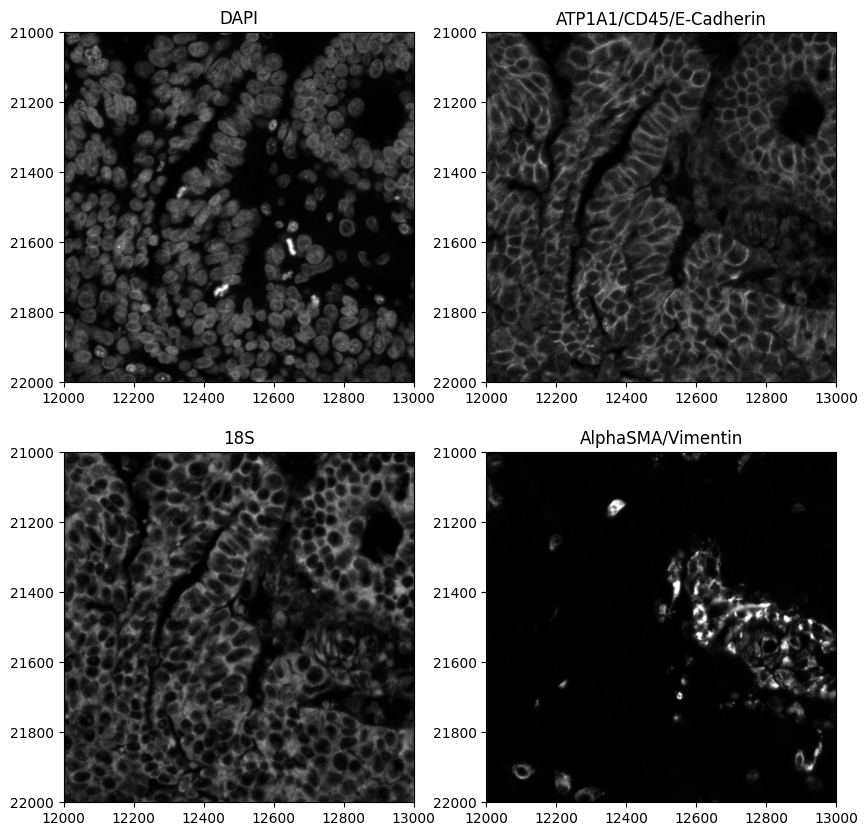

In [6]:
# First, we plot the raw images for comparison
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

for ax, channel in zip(axes.ravel(), channels):
    norm = Normalize(vmin=0, vmax=6000)

    ax = hp.pl.plot_sdata(
        sdata,
        image_name="morphology_focus_global",
        channel=channel,
        crd=(12000, 13000, 21000, 22000),
        to_coordinate_system="global",
        render_images_kwargs={"cmap": "grey", "norm": norm},
        show_kwargs={"title": channel, "colorbar": False},
        ax=ax,
    )

2026-05-26 08:03:50.384 | INFO     | harpy.image._map:_precondition:339 - 'combine_z' is False, but not all 'z-slices' spefified in 'fn_kwargs'/'func' ({'size_min_max_filter': 55}/<function min_max_filtering.<locals>._apply_min_max_filter at 0x1361a4d60>). Specifying z-slices ([0]).
2026-05-26 08:03:50.385 | INFO     | harpy.image._map:_precondition:345 - 'combine_c' is False, but not all channels spefified in 'fn_kwargs'/'func' ({np.int64(0): {'size_min_max_filter': 55}}/{np.int64(0): <function min_max_filtering.<locals>._apply_min_max_filter at 0x1361a4d60>}). Specifying channels (['DAPI' 'ATP1A1/CD45/E-Cadherin' '18S' 'AlphaSMA/Vimentin']).
2026-05-26 08:03:50.440 | INFO     | harpy.image._manager:add_element:47 - Writing results to element 'min_max_filtered'


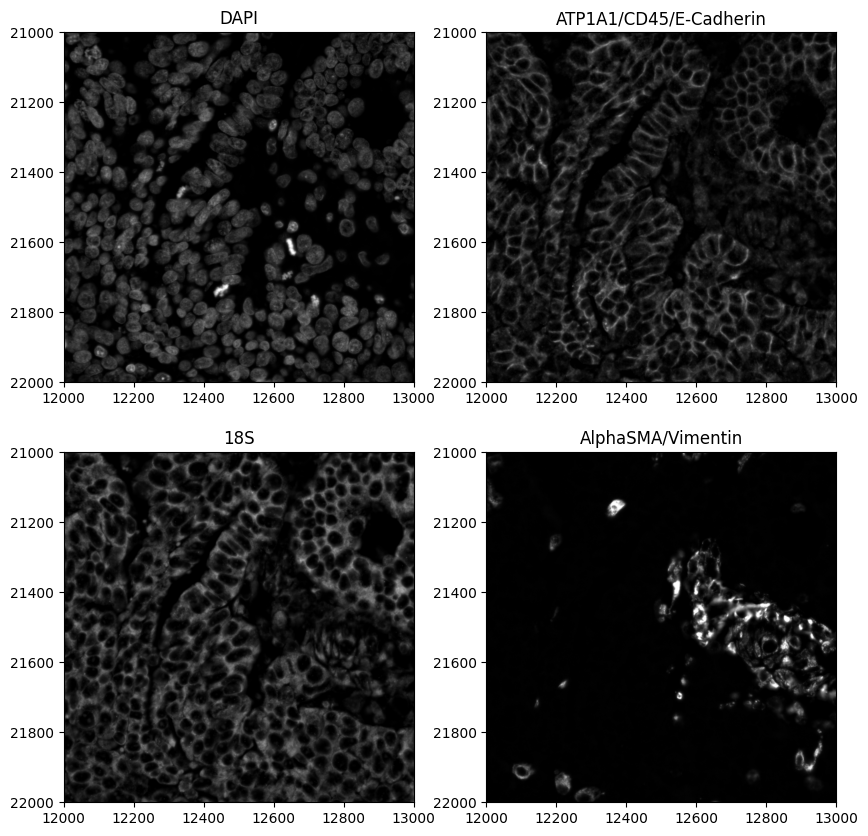

In [7]:
# Perform min max filtering
sdata = hp.im.min_max_filtering(
    sdata,
    image_name="morphology_focus_global",
    output_image_name="min_max_filtered",
    size_min_max_filter=55,
    overwrite=True,
)

# Plot min-max filtered images
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

for ax, channel in zip(axes.ravel(), channels):
    norm = Normalize(vmin=0, vmax=6000)

    ax = hp.pl.plot_sdata(
        sdata,
        image_name="min_max_filtered",
        channel=channel,
        crd=(12000, 13000, 21000, 22000),
        to_coordinate_system="global",
        render_images_kwargs={"cmap": "grey", "norm": norm},
        show_kwargs={"title": channel, "colorbar": False},
        ax=ax,
    )

2026-05-26 08:03:53.232 | INFO     | harpy.image._map:_precondition:339 - 'combine_z' is False, but not all 'z-slices' spefified in 'fn_kwargs'/'func' ({'contrast_clip': 2.5}/<function enhance_contrast.<locals>._apply_clahe at 0x13670bd80>). Specifying z-slices ([0]).
2026-05-26 08:03:53.233 | INFO     | harpy.image._map:_precondition:345 - 'combine_c' is False, but not all channels spefified in 'fn_kwargs'/'func' ({np.int64(0): {'contrast_clip': 2.5}}/{np.int64(0): <function enhance_contrast.<locals>._apply_clahe at 0x13670bd80>}). Specifying channels (['DAPI' 'ATP1A1/CD45/E-Cadherin' '18S' 'AlphaSMA/Vimentin']).
2026-05-26 08:03:53.307 | INFO     | harpy.image._manager:add_element:47 - Writing results to element 'clahe'


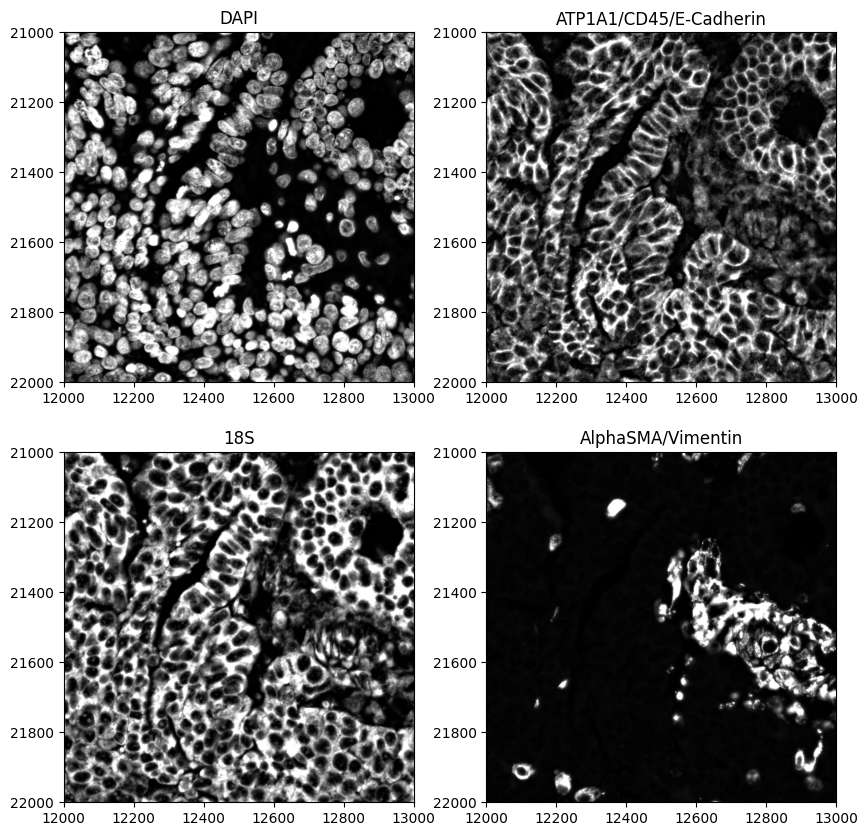

In [8]:
# Perform contrast enhancement using OpenCV ( https://opencv.org/, cv2.createCLAHE )
sdata = hp.im.enhance_contrast(
    sdata,
    image_name="min_max_filtered",
    output_image_name="clahe",
    contrast_clip=2.5,
    chunks=20000,
    overwrite=True,
)

# Plot contrast enhanced images
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

for ax, channel in zip(axes.ravel(), channels):
    norm = Normalize(vmin=0, vmax=6000)

    ax = hp.pl.plot_sdata(
        sdata,
        image_name="clahe",
        channel=channel,
        crd=(12000, 13000, 21000, 22000),
        to_coordinate_system="global",
        render_images_kwargs={"cmap": "grey", "norm": norm},
        show_kwargs={"title": channel, "colorbar": False},
        ax=ax,
    )

<b>Excercise</b>:

- Change the `size_min_max_filter` parameter in `hp.im.min_max_filtering`. What do you see? Try some extreme values.
- Change the `enhance_contrast` parameter in `hp.im.enhance_contrast`. What do you see? Try some extreme values.

### 6.3 ADVANCED: Custom distributed preprocessing of images using `hp.im.map_image` and `Dask`

See https://docs.dask.org/en/stable/generated/dask.array.map_blocks.html and https://docs.dask.org/en/latest/generated/dask.array.map_overlap.html

Set `blockwise==True` if you want to do distributed processing using `dask.array.map_blocks` or `dask.array.map_overlap`, set `blockwise==False` if your function is already distributed (e.g. when using `dask_image` filters https://image.dask.org/en/latest/dask_image.ndfilters.html.)

In [9]:
import numpy as np
from numpy.typing import NDArray


# Define your custom function
def _my_dummy_function(image: NDArray, parameter: int | float) -> NDArray:
    # input (1,1,y,x)
    # output (1,1,y,x)
    print(f"Type of the image is: {type(image)}")
    print(image.shape)
    return image * parameter


fn_kwargs = {"parameter": 2}

# Apply custom function
sdata = hp.im.map_image(
    sdata,
    func=_my_dummy_function,
    fn_kwargs=fn_kwargs,
    image_name="morphology_focus_global",
    output_image_name="dummy_image",
    chunks=2048,
    blockwise=False,  # if blockwise == True --> input to _my_dummy_function is a numpy array of size chunks, else it is a Dask array (with chunksize chunks)
    depth=1000,  # if blockwise == True, and depth specified, will use map_overlap instead of map_blocks for distributed processing
    overwrite=True,
    dtype=np.uint16,
    meta=np.array((), dtype=np.uint16),
)

2026-05-26 08:03:55.421 | INFO     | harpy.image._map:_precondition:339 - 'combine_z' is False, but not all 'z-slices' spefified in 'fn_kwargs'/'func' ({'parameter': 2}/<function _my_dummy_function at 0x13f0db2e0>). Specifying z-slices ([0]).
2026-05-26 08:03:55.422 | INFO     | harpy.image._map:_precondition:345 - 'combine_c' is False, but not all channels spefified in 'fn_kwargs'/'func' ({np.int64(0): {'parameter': 2}}/{np.int64(0): <function _my_dummy_function at 0x13f0db2e0>}). Specifying channels (['DAPI' 'ATP1A1/CD45/E-Cadherin' '18S' 'AlphaSMA/Vimentin']).
2026-05-26 08:03:55.495 | INFO     | harpy.image._manager:add_element:47 - Writing results to element 'dummy_image'


Type of the image is: <class 'dask.array.core.Array'>
(1, 1, 4000, 4000)
Type of the image is: <class 'dask.array.core.Array'>
(1, 1, 4000, 4000)
Type of the image is: <class 'dask.array.core.Array'>
(1, 1, 4000, 4000)
Type of the image is: <class 'dask.array.core.Array'>
(1, 1, 4000, 4000)


In [10]:
hp.im.get_dataarray(sdata, element_name="morphology_focus_global").data.compute()[
    :, :3, :3
]

array([[[ 498,  556,  676],
        [ 462,  577,  669],
        [ 454,  517,  642]],

       [[1746, 1917, 2114],
        [1596, 1821, 2042],
        [1439, 1637, 1814]],

       [[1678, 1657, 1693],
        [1658, 1626, 1640],
        [1595, 1553, 1528]],

       [[  55,   79,   75],
        [  62,   66,   84],
        [  69,   57,   62]]], dtype=uint16)

In [11]:
# We can see that in the dummy image, all values were multiplied by 2
hp.im.get_dataarray(sdata, element_name="dummy_image").data.compute()[:, :3, :3]

array([[[ 996, 1112, 1352],
        [ 924, 1154, 1338],
        [ 908, 1034, 1284]],

       [[3492, 3834, 4228],
        [3192, 3642, 4084],
        [2878, 3274, 3628]],

       [[3356, 3314, 3386],
        [3316, 3252, 3280],
        [3190, 3106, 3056]],

       [[ 110,  158,  150],
        [ 124,  132,  168],
        [ 138,  114,  124]]], dtype=uint16)

<b>Excercise</b>:

- Adapt `my_dummy_function` so it accepts a new parameter, `parameter_2`. Now adapt `my_dummy_function` so the image is multiplied with (`parameter` + `parameter_2`)

<details>
<summary>Click to reveal the solution</summary>

```python
def _my_dummy_function(image: NDArray, parameter: int | float, parameter_2: int | float )->NDArray:
    # input (1,1,y,x)
    # output (1,1,y,x)
    print(f"Type of the image is: {type(image)}" )
    print(image.shape)
    return image*(parameter + parameter_2)

fn_kwargs = {"parameter": 2 , "parameter_2": 2}

sdata = hp.im.map_image(
    sdata,
    func = _my_dummy_function,
    fn_kwargs = fn_kwargs,
    image_name = "morphology_focus_global",
    output_image_name="dummy_image",
    chunks = 5000,
    blockwise = True, # if blockwise == True --> input to _my_dummy_function is a numpy array of size chunks, else it is a Dask array (with chunksize chunks)
    depth = 1000, # if blockwise == True, and depth specified, will use map_overlap instead of map_blocks for distributed processing
    overwrite = True,
    dtype = np.uint16,
    meta = np.array((), dtype=np.uint16),
)

<b>Excercise</b>:

- Bonus: Run the cell where `hp.im.map_image` is called in debug mode. Set a breakpoint in `my_dummy_function`. Inspect the shape and type of `image` when you set `blockwise=True` or `blockwise=False`. Set the `depth` parameter to `100`. What do you observe?

## 7. Segmentation

### 7.1 Nucleus segmentation

To segment the nuclei, we will show an example using Cellpose 3, a deep learning network based on a UNET architecture. Note that we need to make sure that we installed the correct version of Cellpose to use Cellpose 3 and not the newer Cellpose 4. Cellpose 4 (a.k.a. Cellpose-SAM) works really well, but is a lot slower so it is less suited for the training. Unfortunately, we can not simply install the latest version and select which model we want to use using the API.

Multiple parameters need to be given as an input to the cellpose algorithm. We recommend tuning these to achieve optimal segmentation quality (see https://cellpose.readthedocs.io/en/v3.1.1.1/settings.html). It is often a good idea to fine-tune the parameters on a crop of the image (especially when you only have CPU to work with).
 
- diameter: Includes an estimate of the average nucleus diameter and needs to be given in pixels. If set to None, cellpose will try to estimate the diameter, but this might take a long time and is usually far off. As a guideline, you can use approx. 7 micrometer (in this case 33 pixels at 0.2125 micrometer per pixel) for a standard nucleus, but this may vary depending on your specific tissue, sample...
- device: Defines the device you want to work on. If you only have CPU, you can skip this input parameter.
- flow_threshold: Indicates something about the shape of the masks. If you increase it, more masks with less round shapes will be accepted. Usually set between 0.6 and 0.95 (max. is 1). Lower this parameter if you start segmenting artefacts. Increase it if the segmentation misses some non-round cells.
- mask_threshold: Indicates how many of the possible masks are kept. Decreasing the parameter will output more masks. Larger values will output less masks. Usually set between 0 and -6.
- min_size: Indicates the minimum size of a nucleus.
- model_type: If segmenting whole cells instead of nuclei, set this to 'cyto'. You can do this with and without a nucleus channel. When you want to include a nucleus channel for the segmentation, make sure your image is 3D and that the first channel contains the complete cell staining and the second one the nucleus channel (put the channel parameter to np.array([1,0])).

In [12]:
import cellpose
from loguru import logger

logger.info(f"Below cells were run with Cellpose version {cellpose.version}.")

2026-05-26 08:03:57.146 | INFO     | __main__:<module>:4 - Below cells were run with Cellpose version 3.1.1.3.


In [13]:
# First, we rechunk the preprocessed image to 2048 on disk (since they were created with chunks=20000).
from spatialdata.transformations import get_transformation

arr = hp.im.get_dataarray(sdata, element_name="clahe").data.rechunk((1, 1024, 1024))
transformations = get_transformation(sdata.images["clahe"], get_all=True)

se = hp.im.get_dataarray(sdata, element_name="clahe")
c_coords = se.c.data

sdata = hp.im.add_image(
    sdata,
    arr=arr,
    output_image_name="clahe",
    transformations=transformations,  # copy the transformations
    c_coords=c_coords,
    scale_factors=[2, 2, 2, 2],  # save as multiscale
    overwrite=True,
)
sdata["clahe"]

2026-05-26 08:03:57.177 | INFO     | harpy.image._manager:add_element:47 - Writing results to element 'clahe'
2026-05-26 08:03:57.758 | WARNING  | harpy.utils._io:_incremental_io_on_disk:86 - Element with name 'clahe' already exists. Overwriting...


<xarray.DataTree>
Group: /
├── Group: /scale0
│       Dimensions:  (c: 4, y: 4000, x: 4000)
│       Coordinates:
│         * c        (c) <U22 352B 'DAPI' ... 'AlphaSMA/Vimentin'
│         * y        (y) float64 32kB 0.5 1.5 2.5 3.5 ... 3.998e+03 3.998e+03 4e+03
│         * x        (x) float64 32kB 0.5 1.5 2.5 3.5 ... 3.998e+03 3.998e+03 4e+03
│       Data variables:
│           image    (c, y, x) uint16 128MB dask.array<chunksize=(1, 1024, 1024), meta=np.ndarray>
├── Group: /scale1
│       Dimensions:  (c: 4, y: 2000, x: 2000)
│       Coordinates:
│         * c        (c) <U22 352B 'DAPI' ... 'AlphaSMA/Vimentin'
│         * y        (y) float64 16kB 1.0 3.0 5.0 7.0 ... 3.995e+03 3.997e+03 3.999e+03
│         * x        (x) float64 16kB 1.0 3.0 5.0 7.0 ... 3.995e+03 3.997e+03 3.999e+03
│       Data variables:
│           image    (c, y, x) uint16 32MB dask.array<chunksize=(1, 1024, 1024), meta=np.ndarray>
├── Group: /scale2
│       Dimensions:  (c: 4, y: 1000, x: 1000)
│       Coordinates:
│         * c        (c) <U22 352B 'DAPI' ... 'AlphaSMA/Vimentin'
│         * y        (y) float64 8kB 2.0 6.0 10.0 14.0 ... 3.99e+03 3.994e+03 3.998e+03
│         * x        (x) float64 8kB 2.0 6.0 10.0 14.0 ... 3.99e+03 3.994e+03 3.998e+03
│       Data variables:
│           image    (c, y, x) uint16 8MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
├── Group: /scale3
│       Dimensions:  (c: 4, y: 500, x: 500)
│       Coordinates:
│         * c        (c) <U22 352B 'DAPI' ... 'AlphaSMA/Vimentin'
│         * y        (y) float64 4kB 4.0 12.0 20.0 28.0 ... 3.98e+03 3.988e+03 3.996e+03
│         * x        (x) float64 4kB 4.0 12.0 20.0 28.0 ... 3.98e+03 3.988e+03 3.996e+03
│       Data variables:
│           image    (c, y, x) uint16 2MB dask.array<chunksize=(1, 500, 500), meta=np.ndarray>
└── Group: /scale4
        Dimensions:  (c: 4, y: 250, x: 250)
        Coordinates:
          * c        (c) <U22 352B 'DAPI' ... 'AlphaSMA/Vimentin'
          * y        (y) float64 2kB 8.0 24.0 40.0 56.0 ... 3.96e+03 3.976e+03 3.992e+03
          * x        (x) float64 2kB 8.0 24.0 40.0 56.0 ... 3.96e+03 3.976e+03 3.992e+03
        Data variables:
            image    (c, y, x) uint16 500kB dask.array<chunksize=(1, 250, 250), meta=np.ndarray>

In [14]:
hp.im.get_dataarray(sdata, element_name="clahe")

<xarray.DataArray 'image' (c: 4, y: 4000, x: 4000)> Size: 128MB
dask.array<from-zarr, shape=(4, 4000, 4000), dtype=uint16, chunksize=(1, 1024, 1024), chunktype=numpy.ndarray>
Coordinates:
  * c        (c) <U22 352B 'DAPI' ... 'AlphaSMA/Vimentin'
  * y        (y) float64 32kB 0.5 1.5 2.5 3.5 ... 3.998e+03 3.998e+03 4e+03
  * x        (x) float64 32kB 0.5 1.5 2.5 3.5 ... 3.998e+03 3.998e+03 4e+03
Attributes:
    transform:  {'global': Sequence \n    Translation (c, y, x)\n        [   ...

In [15]:
import os

import torch
from dask.distributed import Client, LocalCluster
from loguru import logger

"""
We set up a local Dask distributed cluster to overwrite dask default behaviour (threaded processing).
Once the cluster is created, a Dask Client is used to connect to it. 
The Dask dashboard link allows you to monitor cluster performance and task progress.
"""

if torch.cuda.is_available():
    device = "cuda"
elif torch.backends.mps.is_available():
    device = "mps"
else:
    device = "cpu"

logger.info(f"Using device: {device}")

n_workers = 1 if device in {"cuda", "mps"} else 12

# Create a local Dask cluster
cluster = LocalCluster(
    n_workers=n_workers,  # Use a single worker for GPU/MPS; otherwise use 12 CPU workers.
    threads_per_worker=1,  # Number of threads per worker
    memory_limit="32GB",  # Memory limit per worker
    local_directory=os.environ.get("TMPDIR"),
)

client = Client(cluster)
logger.info(client.dashboard_link)

# Perform nucleus segmentation
sdata = hp.im.segment(
    sdata,
    image_name="clahe",  # The image layer in sdata to be segmented.
    chunks=None,  # Settings chunks=None would be equivalent to settings chunks=2048, as chunks on disk are 2048
    depth=200,
    model=hp.im.cellpose_callable,
    # parameters that will be passed to the callable _cellpose:
    pretrained_model="nuclei",  # can also be "cyto", "cyto3", or a path to a fine-tuned cellpose model.
    device=device,
    diameter=33,
    flow_threshold=0.9,
    cellprob_threshold=-4,
    output_labels_name="nucleus_segmentation_mask",
    output_shapes_name="nucleus_segmentation_mask_boundaries",
    crd=None,  # region to segment [x_min, xmax, y_min, y_max], set to [10000,11000,18000,19000] if working on a low end laptop.
    channels=[1, 0],  # This specifies we are segmenting nuclei in grayscale
    overwrite=True,
)

client.close()

2026-05-26 08:03:58.422 | INFO     | __main__:<module>:20 - Using device: mps
2026-05-26 08:04:00.921 | INFO     | __main__:<module>:33 - http://127.0.0.1:62040/status
2026-05-26 08:04:03.009 | INFO     | harpy.image.segmentation._segmentation:_precondition:434 - Provided array is chunked in 'z' and/or 'c' dimension. Will rechunk in 'z' and/or 'c' dimension.
/Users/arne.defauw/VIB/targeted_transcriptomics_training/.venv/lib/python3.12/site-packages/cellpose/dynamics.py:760: UserWarning: Sparse invariant checks are implicitly disabled. Memory errors (e.g. SEGFAULT) will occur when operating on a sparse tensor which violates the invariants, but checks incur performance overhead. To silence this warning, explicitly opt in or out. See `torch.sparse.check_sparse_tensor_invariants.__doc__` for guidance.  (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:767.)
  coo = torch.sparse_coo_tensor(pt, torch.ones(pt.shape[1], device=pt.device, dtype=torch.int),
20

In [16]:
from spatialdata.transformations import get_transformation

display(
    get_transformation(sdata["nucleus_segmentation_mask"], get_all=True)
)  # -> microns per pixel is 0.2125
microns_per_pixel = 0.2125

{'global': Sequence 
     Translation (y, x)
         [3000. 2000.]
     Sequence 
         Translation (y, x)
             [18000. 10000.]
         Identity ,
 'global_micron': Sequence 
     Translation (y, x)
         [3000. 2000.]
     Sequence 
         Translation (y, x)
             [18000. 10000.]
         Sequence 
             Identity 
             Scale (y, x)
                 [0.2125 0.2125]}

,labels_name,total_instances,total_area_μm²,covered_area_μm²,covered_area_percentage
0,nucleus_segmentation_mask,5869,722500.0,365163.06,50.5416


2026-05-26 08:04:43.076 | INFO     | harpy.qc._qc_segmentation:segmentation_histogram:162 - Calculating cell size for labels element 'nucleus_segmentation_mask'.
2026-05-26 08:04:43.200 | INFO     | harpy.qc._qc_segmentation:segmentation_histogram:166 - Converting cell area from pixels to square microns using microns_per_pixel=0.2125.


<Axes: xlabel='Instance Size (μm²)', ylabel='Number of instances'>

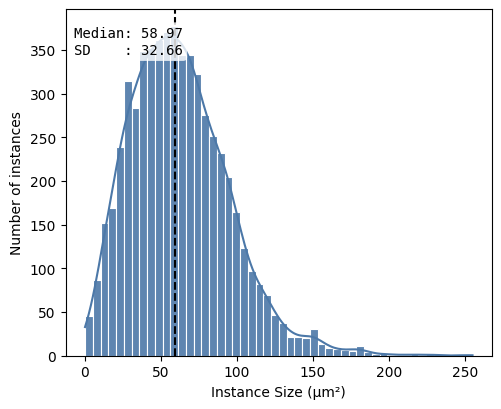

In [17]:
df = hp.qc.segmentation_coverage(
    sdata,
    labels_name="nucleus_segmentation_mask",
    microns_per_pixel=microns_per_pixel,
)
display(df)
hp.qc.segmentation_histogram(
    sdata,
    labels_name="nucleus_segmentation_mask",
    microns_per_pixel=microns_per_pixel,
    bins=50,
)


In [18]:
sdata

SpatialData object, with associated Zarr store: /private/var/folders/sz/t3tgg4fs4tz9btm0fbqg_tzc0000gn/T/xenium__en2vp3a/sdata.zarr
├── Images
│     ├── 'clahe': DataTree[cyx] (4, 4000, 4000), (4, 2000, 2000), (4, 1000, 1000), (4, 500, 500), (4, 250, 250)
│     ├── 'dummy_image': DataArray[cyx] (4, 4000, 4000)
│     ├── 'he_image_global': DataTree[cyx] (3, 3128, 3128), (3, 1564, 1564), (3, 782, 782), (3, 391, 391), (3, 195, 195), (3, 97, 97), (3, 48, 48)
│     ├── 'min_max_filtered': DataArray[cyx] (4, 4000, 4000)
│     └── 'morphology_focus_global': DataTree[cyx] (4, 4000, 4000), (4, 2000, 2000), (4, 1000, 1000), (4, 500, 500), (4, 250, 250), (4, 125, 125), (4, 62, 62)
├── Labels
│     ├── 'cell_labels_global': DataTree[yx] (4000, 4000), (2000, 2000), (1000, 1000), (500, 500), (250, 250), (125, 125), (62, 62)
│     ├── 'nucleus_labels_global': DataTree[yx] (4000, 4000), (2000, 2000), (1000, 1000), (500, 500), (250, 250), (125, 125), (62, 62)
│     └── 'nucleus_segmentation_mask': Data

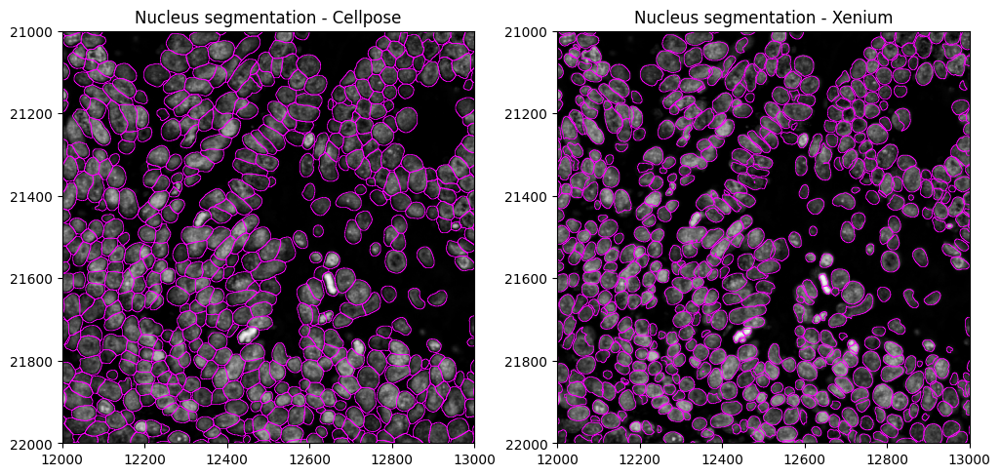

In [19]:
# Plot nucleus segmentation results from Cellpose vs Xenium
min_x = 12000
max_x = 13000
min_y = 21000
max_y = 22000

sdata_crop = sdata.query.bounding_box(
    min_coordinate=[min_x, min_y],
    max_coordinate=[max_x, max_y],
    axes=("x", "y"),
    target_coordinate_system="global",
)

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

shapes_layers = {
    "Cellpose": "nucleus_segmentation_mask_boundaries",
    "Xenium": "nucleus_shapes_global",
}

for ax, (method, shapes_layer) in zip(axes, shapes_layers.items()):
    sdata_crop.pl.render_images(
        element="clahe", cmap="gray", channel="DAPI"
    ).pl.render_shapes(
        element=shapes_layer,
        fill_alpha=0,
        outline_width=0.5,
        outline_alpha=1,
        outline_color="magenta",
    ).pl.show(
        title=f"Nucleus segmentation - {method}",
        coordinate_systems="global",
        colorbar=False,
        ax=ax,
    )

    ax.set_xlim(min_x, max_x)
    ax.set_ylim(min_y, max_y)
    ax.invert_yaxis()


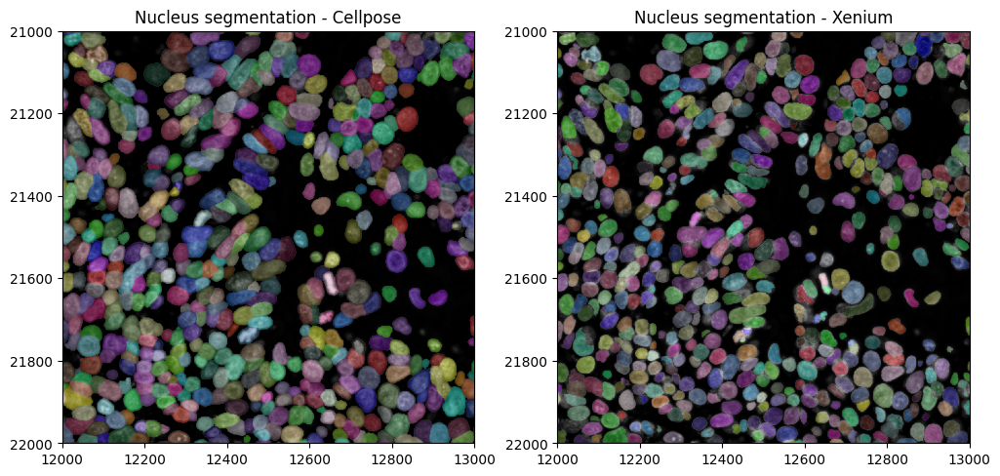

In [20]:
# We can also plot the labels layer to assess the segmentation results
min_x = 12000
max_x = 13000
min_y = 21000
max_y = 22000

sdata_crop = sdata.query.bounding_box(
    min_coordinate=[min_x, min_y],
    max_coordinate=[max_x, max_y],
    axes=("x", "y"),
    target_coordinate_system="global",
)

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

labels_layers = {
    "Cellpose": "nucleus_segmentation_mask",
    "Xenium": "nucleus_labels_global",
}

for ax, (method, labels_layer) in zip(axes, labels_layers.items()):
    sdata_crop.pl.render_images(
        element="clahe", cmap="gray", channel="DAPI"
    ).pl.render_labels(
        element=labels_layer,
    ).pl.show(
        title=f"Nucleus segmentation - {method}",
        coordinate_systems="global",
        colorbar=False,
        ax=ax,
    )

    ax.set_xlim(min_x, max_x)
    ax.set_ylim(min_y, max_y)
    ax.invert_yaxis()

<b>Excercise</b>:

- Try changing segmentation parameters to see how they affect the results. Work on a crop of the image.

### 7.2 Nucleus expansion
In some cases, it may be useful to expand de nuclei segmentations to approximate the cell bodies. Note that this is not very precise and, while it increases the number of transcripts assigned to a cell, it also introduces more wrongly assigned transcripts (i.e. that actually belong to other cells).

In [21]:
# Expand labels layer masks
sdata = hp.im.expand_labels(
    sdata,
    labels_name="nucleus_segmentation_mask",
    distance=10,  # Number of pixels to expand
    output_labels_name="nucleus_segmentation_mask_expanded",  # Creates a new labels element
    output_shapes_name="nucleus_segmentation_mask_expanded_boundaries",  # Creates a new shapes element
    overwrite=True,
)

2026-05-26 08:04:46.203 | INFO     | harpy.image.segmentation._map:_combine_dask_arrays:339 - Linking labels across chunks.
2026-05-26 08:04:46.238 | INFO     | harpy.image._manager:add_element:47 - Writing results to element 'nucleus_segmentation_mask_expanded'
no parent found for <ome_zarr.reader.Label object at 0x147862480>: None
no parent found for <ome_zarr.reader.Label object at 0x14781bdd0>: None
2026-05-26 08:04:47.466 | INFO     | harpy.shape._manager:_mask_to_polygons_rasterio:338 - Finished vectorizing. Dissolving shapes at the border of the chunks. This can take a couple minutes if input mask contains many chunks.
2026-05-26 08:04:47.584 | INFO     | harpy.shape._manager:_mask_to_polygons_rasterio:344 - Dissolve is done.


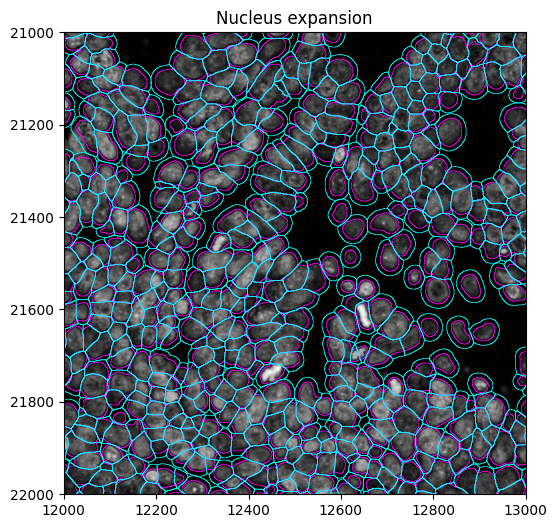

In [22]:
# Plot nucleus segmentation results from Cellpose
min_x = 12000
max_x = 13000
min_y = 21000
max_y = 22000

sdata_crop = sdata.query.bounding_box(
    min_coordinate=[min_x, min_y],
    max_coordinate=[max_x, max_y],
    axes=("x", "y"),
    target_coordinate_system="global",
)

fig, ax = plt.subplots(figsize=(6, 6))

sdata_crop.pl.render_images(
    element="clahe", cmap="gray", channel="DAPI"
).pl.render_shapes(
    element="nucleus_segmentation_mask_boundaries",
    fill_alpha=0,
    outline_width=0.5,
    outline_alpha=1,
    outline_color="magenta",
).pl.render_shapes(
    element="nucleus_segmentation_mask_expanded_boundaries",
    fill_alpha=0,
    outline_width=0.5,
    outline_alpha=1,
    outline_color="cyan",
).pl.show(
    title="Nucleus expansion",
    coordinate_systems="global",
    colorbar=False,
    ax=ax,
)

ax.set_xlim(min_x, max_x)
ax.set_ylim(min_y, max_y)
ax.invert_yaxis()

### 7.3 Multimodal cell segmentation
The Xenium [protocol](https://www.10xgenomics.com/support/in-situ-gene-expression/documentation/steps/assay/xenium-in-situ-gene-expression-with-morphology-based-cell-segmentation-staining-user-guide) supports multimodal cell segmentation using its cell segmentation staining kit.

The kit uses these 4 stains:
- DAPI: nuclear stain
- ATP1A1 / CD45 / E-Cadherin: membrane stains; clear boundaries for epithelial and immune cells
- 18S: 18S ribosomal RNA, labels the cytoplasm, pan-cell type marker
- AlphaSMA / Vimentin: interior protein staining; overlaps with 18S; not currently used by Xenium's onboard segmentation algorithm

We can choose to accept the segmentation masks created by Xenium Onboard Analysis or we can try to improve it ourselves using the state-of-the-art segmentation models.

#### 7.3.1 Xenium multimodal segmentation
Multi-model segmentation proceeds as follows (more information [here](https://cdn.10xgenomics.com/image/upload/v1754601291/support-documents/CG000750_XeniumInSitu_CellSegmentation_TechNote_RevB.pdf)):

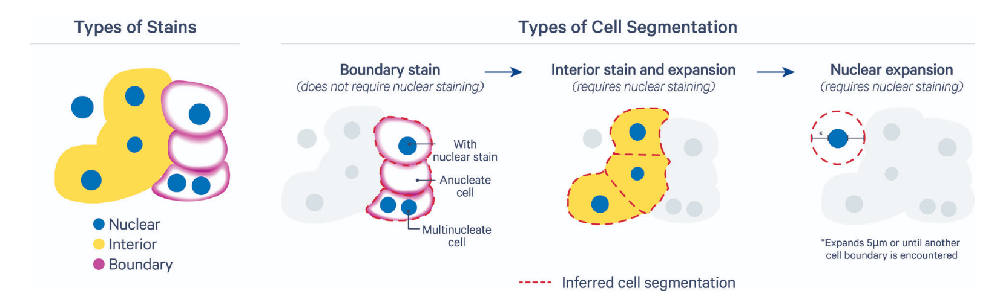

In [23]:
# Inspect channel names
se = hp.im.get_dataarray(sdata, element_name="morphology_focus_global")
channels = se.c.data

print("Channel names:", channels)

Channel names: ['DAPI' 'ATP1A1/CD45/E-Cadherin' '18S' 'AlphaSMA/Vimentin']


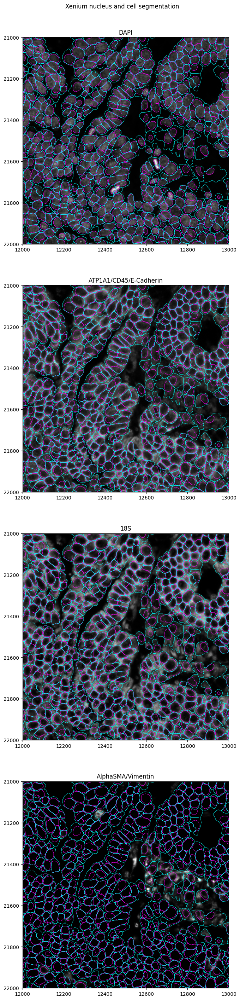

In [24]:
# Plot segmentation results from Xenium
min_x = 12000
max_x = 13000
min_y = 21000
max_y = 22000

sdata_crop = sdata.query.bounding_box(
    min_coordinate=[min_x, min_y],
    max_coordinate=[max_x, max_y],
    axes=("x", "y"),
    target_coordinate_system="global",
)

fig, axes = plt.subplots(4, 1, figsize=(8, 32))
norm = Normalize(vmin=0, vmax=4000)

for ax, channel in zip(axes.ravel(), channels):
    sdata_crop.pl.render_images(
        element="morphology_focus_global",
        channel=channel,
        cmap="gray",
    ).pl.render_shapes(
        element="nucleus_shapes_global",
        fill_alpha=0,
        outline_width=0.5,
        outline_alpha=1,
        outline_color="magenta",
    ).pl.render_shapes(
        element="cell_shapes_global",
        fill_alpha=0,
        outline_width=0.5,
        outline_alpha=1,
        outline_color="cyan",
    ).pl.show(
        title=channel,
        coordinate_systems="global",
        colorbar=False,
        ax=ax,
    )

    ax.set_xlim(min_x, max_x)
    ax.set_ylim(min_y, max_y)
    ax.invert_yaxis()

fig.suptitle("Xenium nucleus and cell segmentation")
fig.subplots_adjust(top=0.95)

WARNING  render_labels: Converting copy of 'segmentation_method' column to categorical dtype for categorical       
         plotting. Consider converting before plotting.                                                            


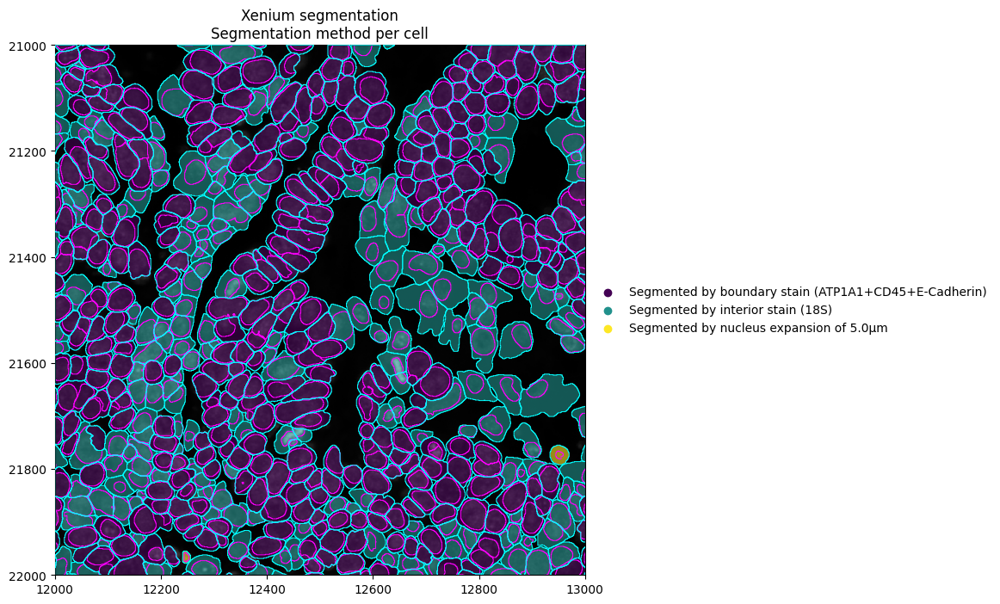

In [25]:
# Plot the Xenium segmentation method that was used per cell
min_x = 12000
max_x = 13000
min_y = 21000
max_y = 22000

sdata_crop = sdata.query.bounding_box(
    min_coordinate=[min_x, min_y],
    max_coordinate=[max_x, max_y],
    axes=("x", "y"),
    target_coordinate_system="global",
)

fig, ax = plt.subplots(figsize=(8, 8))
norm = Normalize(vmin=0, vmax=3000)

sdata_crop.pl.render_images(
    element="morphology_focus_global",
    channel="DAPI",
    cmap="gray",
).pl.render_labels(
    element="cell_labels_global",
    fill_alpha=0.6,
    contour_px=3,
    outline_alpha=0,
    cmap="viridis",
    color="segmentation_method",
    table_name="table_global",
).pl.render_shapes(
    element="nucleus_shapes_global",
    fill_alpha=0,
    outline_width=0.7,
    outline_alpha=1,
    outline_color="magenta",
).pl.render_shapes(
    element="cell_shapes_global",
    fill_alpha=0,
    outline_width=0.7,
    outline_alpha=1,
    outline_color="cyan",
).pl.show(
    title="Xenium segmentation\nSegmentation method per cell",
    coordinate_systems="global",
    colorbar=False,
    ax=ax,
)

ax.set_xlim(min_x, max_x)
ax.set_ylim(min_y, max_y)
ax.invert_yaxis()

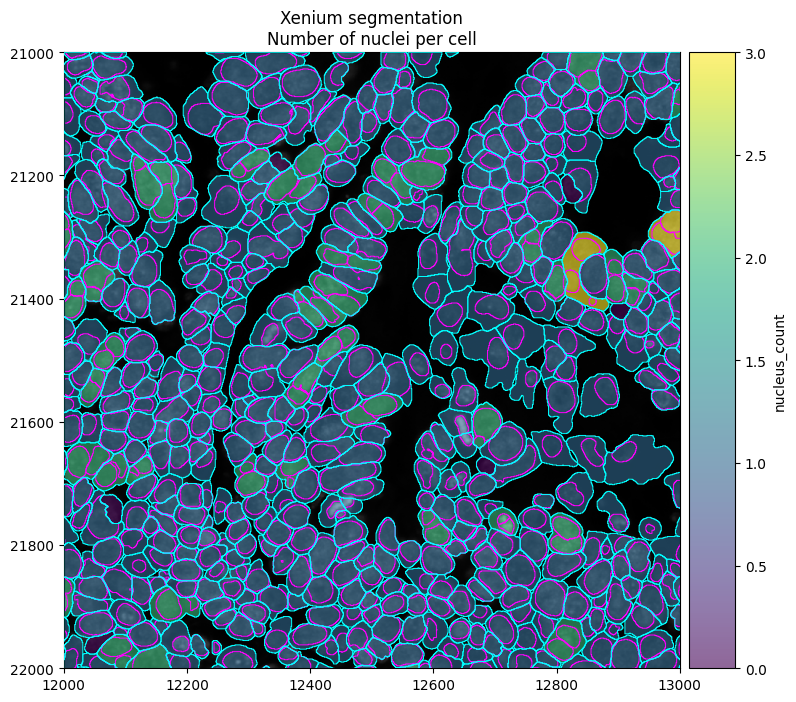

In [26]:
# Plot number of nuclei per cell in Xenium segmentation
min_x = 12000
max_x = 13000
min_y = 21000
max_y = 22000

sdata_crop = sdata.query.bounding_box(
    min_coordinate=[min_x, min_y],
    max_coordinate=[max_x, max_y],
    axes=("x", "y"),
    target_coordinate_system="global",
)

fig, ax = plt.subplots(figsize=(8, 8))
norm = Normalize(vmin=0, vmax=3000)

sdata_crop.pl.render_images(
    element="morphology_focus_global",
    channel="DAPI",
    cmap="gray",
    colorbar=False,
).pl.render_labels(
    element="cell_labels_global",
    fill_alpha=0.6,
    contour_px=3,
    outline_alpha=0,
    cmap="viridis",
    color="nucleus_count",
    table_name="table_global",
    colorbar=True,
).pl.render_shapes(
    element="nucleus_shapes_global",
    fill_alpha=0,
    outline_width=0.7,
    outline_alpha=1,
    outline_color="magenta",
).pl.render_shapes(
    element="cell_shapes_global",
    fill_alpha=0,
    outline_width=0.7,
    outline_alpha=1,
    outline_color="cyan",
).pl.show(
    title="Xenium segmentation\nNumber of nuclei per cell",
    coordinate_systems="global",
    ax=ax,
)

ax.set_xlim(min_x, max_x)
ax.set_ylim(min_y, max_y)
ax.invert_yaxis()

#### 7.3.2 Cell segmentation using Cellpose 3

In [27]:
se = hp.im.get_dataarray(sdata, element_name="morphology_focus_global")
channels_idx = [
    se.c.data.tolist().index("ATP1A1/CD45/E-Cadherin") + 1,
    se.c.data.tolist().index("DAPI") + 1,
]  #  + 1 because CellPose channel specifications are 1-indexed!

channels_idx  # [membrane stain index + 1, nuclear stain index + 1]

[2, 1]

In [ ]:
device = "cpu"

sdata = hp.im.segment(
    sdata,
    image_name="morphology_focus_global",
    chunks=None,
    depth=200,
    model=hp.im.cellpose_callable,
    # parameters that will be passed to the callable _cellpose
    pretrained_model="cyto3",
    device=device,
    diameter=33,
    flow_threshold=0.9,
    cellprob_threshold=-4,
    channels=channels_idx,  # NOTE: channels is deprecated in cellpose 4. Cellpose 4 models will segment on the 'first' three channels by default.
    output_labels_name="cell_segmentation_mask",
    output_shapes_name="cell_segmentation_mask_boundaries",
    crd=[
        12000,
        13000,
        21000,
        22000,
    ],  # region to segment [x_min, xmax, y_min, y_max], we only have one chunk, so we do not use a dask client.
    overwrite=True,
)

2026-05-26 08:04:55.322 | INFO     | harpy.image.segmentation._segmentation:_precondition:434 - Provided array is chunked in 'z' and/or 'c' dimension. Will rechunk in 'z' and/or 'c' dimension.
2026-05-26 08:05:10.381 | INFO     | harpy.image.segmentation._segmentation:_segment:681 - Linking labels across chunks.
2026-05-26 08:05:10.385 | INFO     | harpy.image._manager:add_element:47 - Writing results to element 'cell_segmentation_mask'
no parent found for <ome_zarr.reader.Label object at 0x14c3ad220>: None
no parent found for <ome_zarr.reader.Label object at 0x14c3d7410>: None
no parent found for <ome_zarr.reader.Label object at 0x14c76a7b0>: None
2026-05-26 08:05:10.641 | INFO     | harpy.shape._manager:_mask_to_polygons_rasterio:338 - Finished vectorizing. Dissolving shapes at the border of the chunks. This can take a couple minutes if input mask contains many chunks.
2026-05-26 08:05:10.655 | INFO     | harpy.shape._manager:_mask_to_polygons_rasterio:344 - Dissolve is done.


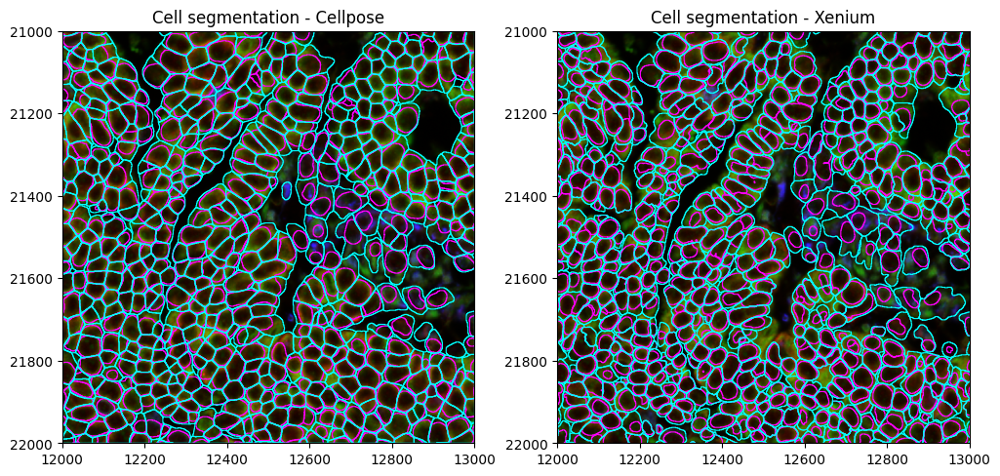

In [29]:
# Plot nucleus segmentation results from Cellpose vs Xenium
min_x = 12000
max_x = 13000
min_y = 21000
max_y = 22000

sdata_crop = sdata.query.bounding_box(
    min_coordinate=[min_x, min_y],
    max_coordinate=[max_x, max_y],
    axes=("x", "y"),
    target_coordinate_system="global",
)

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

shapes_layers = {
    "Cellpose": [
        "nucleus_segmentation_mask_boundaries",
        "cell_segmentation_mask_boundaries",
    ],
    "Xenium": ["nucleus_shapes_global", "cell_shapes_global"],
}

for ax, (method, shapes_layer) in zip(axes, shapes_layers.items()):
    sdata_crop.pl.render_images(
        element="morphology_focus_global",
        channel=["ATP1A1/CD45/E-Cadherin", "18S", "AlphaSMA/Vimentin"],
    ).pl.render_shapes(
        element=shapes_layer[0],
        fill_alpha=0,
        outline_width=0.8,
        outline_alpha=1,
        outline_color="magenta",
    ).pl.render_shapes(
        element=shapes_layer[1],
        fill_alpha=0,
        outline_width=0.8,
        outline_alpha=1,
        outline_color="cyan",
    ).pl.show(
        title=f"Cell segmentation - {method}",
        coordinate_systems="global",
        colorbar=False,
        ax=ax,
    )

    ax.set_xlim(min_x, max_x)
    ax.set_ylim(min_y, max_y)
    ax.invert_yaxis()

## 8. Allocating the transcripts

###  8.1 Creating the count matrix
The transcripts were already read into the SpatialData by the Xenium reader function. For some spatial technologies, it might be necessary to use the general `harpy.io.read_transcripts` function, which you can configure for most types of transcript data. There are also specific reader functions for Resolve Biosciences Molecular Cartography data (`harpy.io.read_resolve_transcripts`) and for Vizgen Merscope data (`harpy.io.read_merscope_transcripts`).

Once the transcripts are read in and we have a segmentation mask, we can allocate the transcripts to the correct cell. This allocation step creates the count matrix saved in an [anndata](https://anndata.readthedocs.io/en/stable/) object.

In [30]:
# Inspect the points layer
sdata.points["transcripts_global"].head()

,x,y,gene
0,12979.852941,21162.500000,AAMP
1,12981.176471,21136.691176,AAMP
2,13007.794118,21047.132353,AAMP
3,13373.602941,21102.205882,AAMP
4,13427.573529,21135.000000,AAMP


In [31]:
from spatialdata.transformations import get_transformation

get_transformation(sdata.points["transcripts_global"], get_all=True)

{'global': Identity ,
 'global_micron': Affine (x, y -> x, y)
     [0.2125 0.     0.    ]
     [0.     0.2125 0.    ]
     [0. 0. 1.]}

In [32]:
# Allocate transcripts to cells based on the segmentation masks
sdata = hp.tb.allocate(
    sdata=sdata,
    labels_name="nucleus_segmentation_mask",  # The labels layer (i.e. nucleus_segmentation mask) in `sdata` to be used to allocate the transcripts to cells.
    points_name="transcripts_global",  # The points layer in `sdata` that contains the transcripts.
    output_table_name="table_transcriptomics",  # The table layer in `sdata` in which to save the AnnData object with the transcripts counts per cell.
    to_coordinate_system="global",  # NOTE: always run the allocation step in the pixel coordinate system. Relation between the points layer and this coordinate system should be an Identity.
    overwrite=True,
)

2026-05-26 08:05:13.157 | INFO     | harpy.table._allocation:_aggregate:494 - Calculating cell counts.


In [33]:
# Inspect the new table layer
display(sdata.tables["table_transcriptomics"])

print("Number of cells: ", len(sdata.tables["table_transcriptomics"].obs.index))
print("Number of genes: ", len(sdata.tables["table_transcriptomics"].var.index))

AnnData object with n_obs × n_vars = 5857 × 5099
    obs: 'cell_ID', 'fov_labels'
    uns: 'spatialdata_attrs'
    obsm: 'spatial'

Number of cells:  5857
Number of genes:  5099


In [34]:
# Inspect the count matrix in the new table layer
sdata.tables[
    "table_transcriptomics"
].to_df().head()  # On large count matrices, calls to .to_df() should be avoided

,A2ML1,AAMP,AAR2,AARSD1,ABAT,ABCA1,ABCA10,ABCA3,ABCA4,ABCA7,...,ZPR1,ZSCAN1,ZSCAN12,ZSCAN16,ZSCAN20,ZSCAN26,ZSWIM6,ZUP1,ZYG11B,ZYX
cells,,,,,,,,,,,,,,,,,,,,,
1039_nucleus_segmentation_mask_345aa67d,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1071_nucleus_segmentation_mask_345aa67d,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1135_nucleus_segmentation_mask_345aa67d,0,0,0,0,0,1,2,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1167_nucleus_segmentation_mask_345aa67d,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
1199_nucleus_segmentation_mask_345aa67d,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [35]:
# Inspect the var of the new table layer
sdata.tables["table_transcriptomics"].var.head()

""
A2ML1
AAMP
AAR2
AARSD1
ABAT


In [36]:
# Inspect the obs of the new table layer
sdata.tables["table_transcriptomics"].obs.head()

,cell_ID,fov_labels
cells,,
1039_nucleus_segmentation_mask_345aa67d,1039,nucleus_segmentation_mask
1071_nucleus_segmentation_mask_345aa67d,1071,nucleus_segmentation_mask
1135_nucleus_segmentation_mask_345aa67d,1135,nucleus_segmentation_mask
1167_nucleus_segmentation_mask_345aa67d,1167,nucleus_segmentation_mask
1199_nucleus_segmentation_mask_345aa67d,1199,nucleus_segmentation_mask


In [37]:
# Inspect the spatial coordinates stored in obsm
sdata.tables["table_transcriptomics"].obsm["spatial"][
    :5
]  # x,y,(z) coordinates of cell centroid (calculated based on mean transcripts location)

array([[15317.95412844, 24050.52293578],
       [15975.33816425, 24070.51449275],
       [15120.86557377, 24053.00655738],
       [15877.76150628, 24069.48953975],
       [15712.60169492, 24060.31355932]])

In [38]:
# Inspect the spatialdata_attrs in .uns to check the instance_key and region_key
from spatialdata.models import TableModel

sdata.tables["table_transcriptomics"].uns[TableModel.ATTRS_KEY]

# NOTE: The AnnData object that is added as a table layer annotates the labels "nucleus_segmentation_mask". The instance_key ('cell_ID') matches the labels in "nucleus_segmentation_mask".
# NOTE: Both shapes, labels and points can be annotated by a table, but in Harpy we currently only annotate labels with a table

{'region': ['nucleus_segmentation_mask'],
 'region_key': 'fov_labels',
 'instance_key': 'cell_ID'}

In [39]:
sdata.tables["table_transcriptomics"].obs.head()

,cell_ID,fov_labels
cells,,
1039_nucleus_segmentation_mask_345aa67d,1039,nucleus_segmentation_mask
1071_nucleus_segmentation_mask_345aa67d,1071,nucleus_segmentation_mask
1135_nucleus_segmentation_mask_345aa67d,1135,nucleus_segmentation_mask
1167_nucleus_segmentation_mask_345aa67d,1167,nucleus_segmentation_mask
1199_nucleus_segmentation_mask_345aa67d,1199,nucleus_segmentation_mask


In [40]:
sdata.tables["table_transcriptomics"].uns[TableModel.ATTRS_KEY][
    TableModel.REGION_KEY
]  # fetch the spatial element annotated by the table (a table can annotate multiple spatial elements (e.g. multiple samples scenario))

['nucleus_segmentation_mask']

In [41]:
sdata.tables["table_transcriptomics"].uns[TableModel.ATTRS_KEY][
    TableModel.REGION_KEY_KEY
]

'fov_labels'

In [42]:
sdata.tables["table_transcriptomics"].uns[TableModel.ATTRS_KEY][TableModel.INSTANCE_KEY]

'cell_ID'

In [43]:
import dask.array as da

print("Number of cells in table:", len(sdata.tables["table_transcriptomics"].obs))
print(
    "Number of segmentation masks in labels layer:",
    len(da.unique(sdata.labels["nucleus_segmentation_mask"].data).compute()) - 1,
)  # We subtract 1 because 0 is also a value, but this corresponds to the background.
print(
    "Number of segmentation boundaries in shapes layer:",
    len(sdata.shapes["nucleus_segmentation_mask_boundaries"]),
)

# NOTE: Not all segmentation masks are included in the table layer "table_transcriptomics". This is because not all cells could be assigned transcripts.

Number of cells in table: 5857
Number of segmentation masks in labels layer: 5869
Number of segmentation boundaries in shapes layer: 5869


### 8.2 Visualizing gene expression

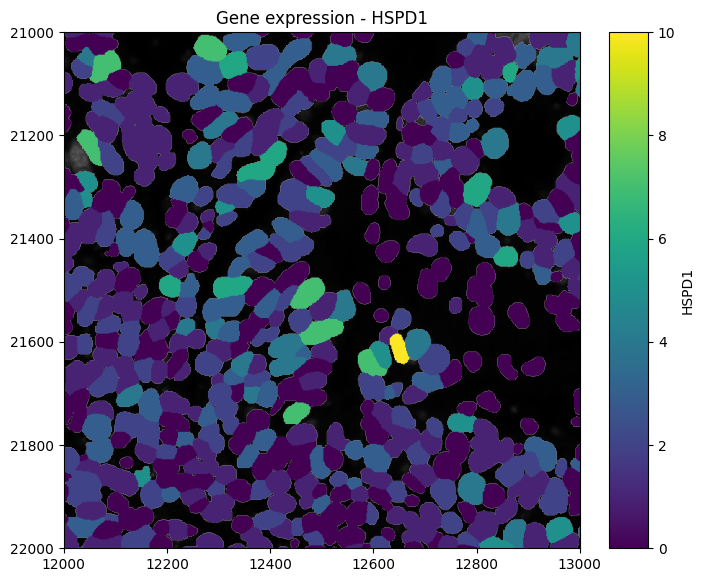

In [44]:
# Plot gene expression for specific gene
min_x = 12000
max_x = 13000
min_y = 21000
max_y = 22000

sdata_crop = sdata.query.bounding_box(
    min_coordinate=[min_x, min_y],
    max_coordinate=[max_x, max_y],
    axes=("x", "y"),
    target_coordinate_system="global",
)

sdata_crop.pl.render_images(
    element="morphology_focus_global", channel="DAPI", cmap="gray", colorbar=False
).pl.render_labels(
    element="nucleus_segmentation_mask",
    fill_alpha=1,
    contour_px=3,
    outline_alpha=0,
    cmap="viridis",
    color="HSPD1",
    table_name="table_transcriptomics",
).pl.show(
    title="Gene expression - HSPD1",
    coordinate_systems="global",
    colorbar=True,
    figsize=(6, 6),
)

2026-05-26 08:05:16.409 | INFO     | harpy.plot._plot_sdata:plot_sdata_genes:540 - Plotting column gene of 'sdata.points[transcripts_global]' as categorical.


<Axes: title={'center': 'Transcripts - HSPD1'}>

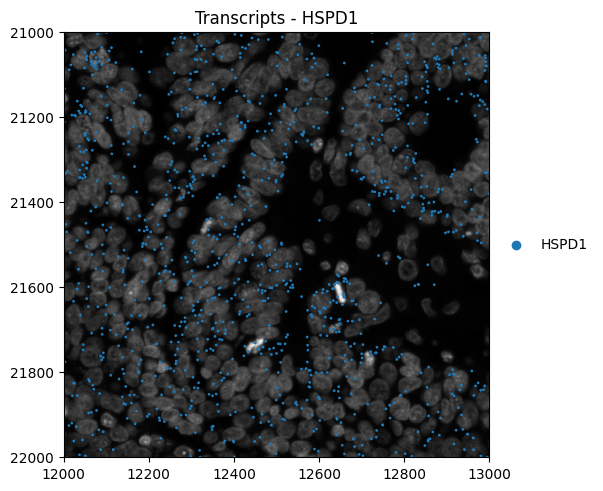

In [45]:
# Compare this against the individual transcripts of that gene
hp.pl.plot_sdata_genes(
    sdata,
    image_name="morphology_focus_global",
    channel="DAPI",
    points_name="transcripts_global",
    crd=(min_x, max_x, min_y, max_y),
    color="cornflowerblue",
    genes=["HSPD1"],
    frac=1,
    size=1,
    render_images_kwargs={"cmap": "grey"},
    show_kwargs={"title": "Transcripts - HSPD1", "colorbar": False},
    to_coordinate_system="global",
)

In [46]:
# Explore gene expression interactively using napari-harpy
from napari_harpy import Interactive

Interactive(sdata, widgets="viewer")

<b>Excercise</b>:

Use `napari-harpy` to visualize the gene expression of a gene.

###  8.3 Transcript quality
After we have created the anndata object, we want to check the transcript quality. First we create a plot to check if the transcript density is similar across the whole tissue. If this isn't the case, there can be multiple biological or technical reasons. Note that gene panel choices can also have an influence.

2026-05-26 08:05:22.492 | INFO     | harpy.image._manager:add_element:47 - Writing results to element 'transcript_density'


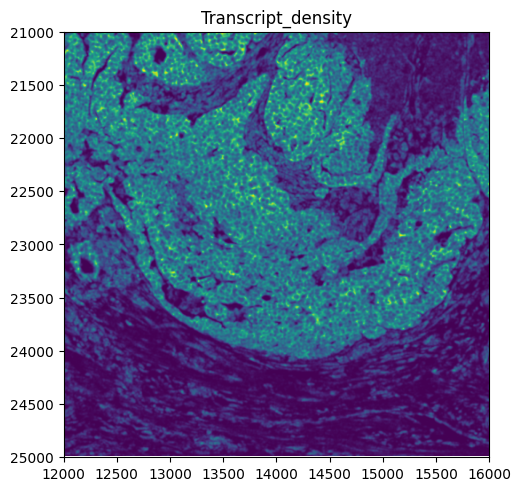

In [47]:
# Create transcript density image
sdata = hp.im.transcript_density(
    sdata,
    image_name="clahe",  # The layer of the SpatialData object used for determining image boundary.
    points_name="transcripts_global",  # The layer name that contains the transcript data points, by default "transcripts".
    output_image_name="transcript_density",  # The name of the output image layer
    to_coordinate_system="global",
    overwrite=True,
)

# Plot transcript density
sdata.pl.render_images(
    element="transcript_density",
).pl.show(
    title="Transcript_density",
    coordinate_systems="global",
    colorbar=False,
)

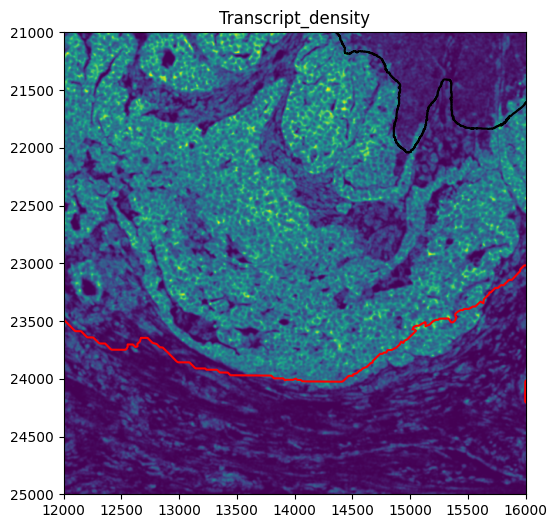

In [48]:
# Let's compare this against our region annotations for tumor and necrosis
fig, ax = plt.subplots(figsize=(12, 6))

xmin = 12000
xmax = 16000
ymin = 21000
ymax = 25000


sdata.pl.render_images(
    element="transcript_density",
).pl.render_shapes(
    element="tumor", color="red", fill_alpha=0, outline_alpha=1, outline_color="red"
).pl.render_shapes(
    element="necrosis",
    color="black",
    fill_alpha=0,
    outline_alpha=1,
    outline_color="black",
).pl.show(
    title="Transcript_density",
    coordinate_systems="global",
    colorbar=False,
    ax=ax,
)

ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
ax.invert_yaxis()

In [49]:
from spatialdata.transformations import get_transformation

get_transformation(sdata.points["transcripts_global"], get_all=True)

{'global': Identity ,
 'global_micron': Affine (x, y -> x, y)
     [0.2125 0.     0.    ]
     [0.     0.2125 0.    ]
     [0. 0. 1.]}

<Axes: >

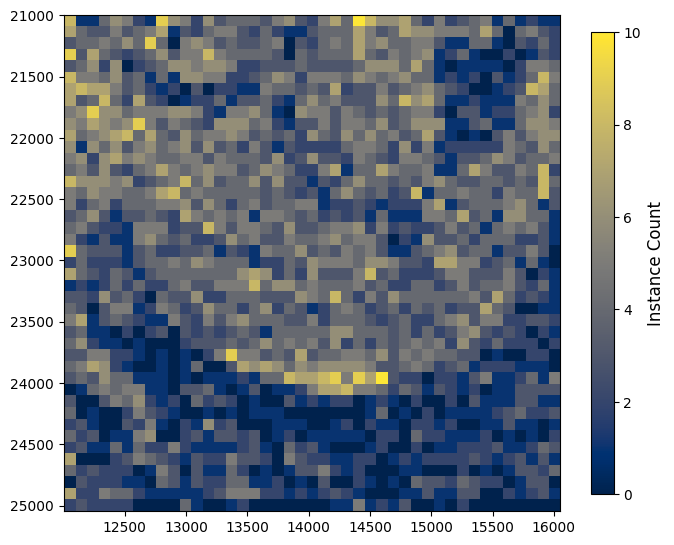

In [50]:
fig, ax = plt.subplots(1, 1, figsize=(8, 8))

hp.pl.plot_instance_density(
    sdata,
    bin_size=20
    / 0.2125,  # bin size in pixels if .obsm["spatial"] of the AnnData table "table_transcriptomics" is in pixels
    spatial_key="spatial",
    table_name="table_transcriptomics",
    cmap="cividis",
    ax=ax,
)

2026-05-26 08:05:24.717 | WARNING  | harpy.plot._plot_density:plot_transcript_density:220 - Computing 2823883 points into memory for plotting; consider using 'genes', 'frac', or 'crd' to reduce this.


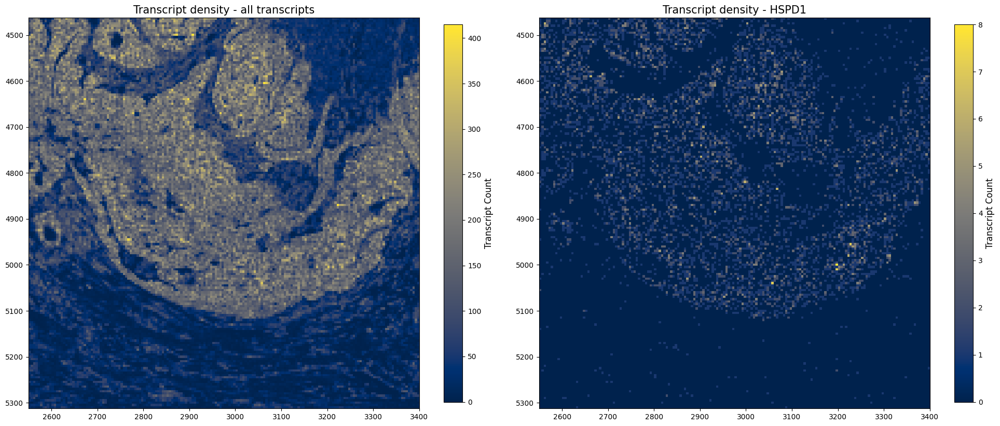

In [51]:
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

ax = hp.pl.plot_transcript_density(
    sdata,
    bin_size=5,  # bin size in micron if we specify micron coordinate system
    points_name="transcripts_global",
    to_coordinate_system="global_micron",
    cmap="cividis",
    frac=1,
    ax=axes[0],
)
ax.set_title("Transcript density - all transcripts", fontsize=15)
# ax.axis("off")

ax = hp.pl.plot_transcript_density(
    sdata,
    bin_size=5,  # bin size in micron if we specify micron coordinate system
    genes="HSPD1",
    cmap="cividis",
    points_name="transcripts_global",
    to_coordinate_system="global_micron",
    frac=1,
    ax=axes[1],
)
ax.set_title("Transcript density - HSPD1", fontsize=15)
# ax.axis("off")

plt.tight_layout()

In [52]:
# Check number of transcripts
print(
    "Number of transcripts in points element: ", len(sdata.points["transcripts_global"])
)
print(
    "Number of transcripts assigned to cells: ",
    sdata.tables["table_transcriptomics"].X.sum(),
)
print(
    "Percentage of transcripts kept: ",
    (
        (sdata.tables["table_transcriptomics"].X.sum())
        / len(sdata.points["transcripts_global"])
    )
    * 100,
)

# NOTE: Only a fraction of transcripts are assigned to cells.

Number of transcripts in points element:  2823883
Number of transcripts assigned to cells:  2022509
Percentage of transcripts kept:  71.62155797531273


In [53]:
# Check number of genes
print(
    "Number of genes in points layer: ",
    sdata.points["transcripts_global"].compute()["gene"].nunique(),
)
print(
    "Number of genes found in cells: ",
    len(sdata.tables["table_transcriptomics"].var.index),
)

# NOTE: In general, we don't want to lose any genes, but this may happen if they have a low abundance.

Number of genes in points layer:  5101
Number of genes found in cells:  5099


In [54]:
# Check which genes are not found in cells
genes_not_found_in_cells = set(
    sdata.points["transcripts_global"].compute()["gene"].unique()
) - set(sdata.tables["table_transcriptomics"].var.index)

print("Number of genes not found in cells: ", len(genes_not_found_in_cells))
print("Genes not found in cells:", genes_not_found_in_cells)


Number of genes not found in cells:  2
Genes not found in cells: {'Human_PTEN_G129E_WT:A', 'HPV18-E6'}


In [55]:
# Convert the transcript points table to a DataFrame
df_transcripts = sdata.points["transcripts_global"].compute()

# Filter and count transcripts for Ms4a7
gene_name = "Human_PTEN_G129E_WT:A"
count = (df_transcripts["gene"] == gene_name).sum()

print(f"Number of transcripts for {gene_name}: {count}")

Number of transcripts for Human_PTEN_G129E_WT:A: 1


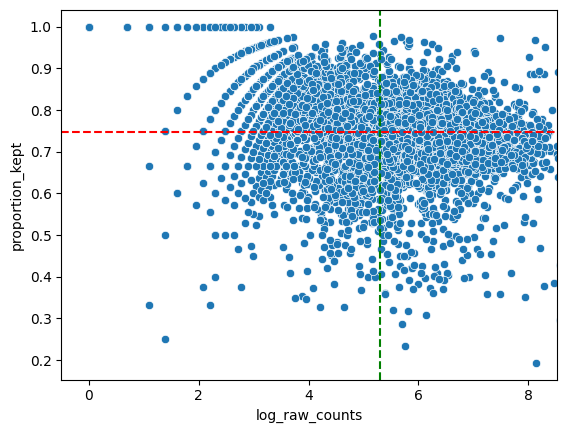

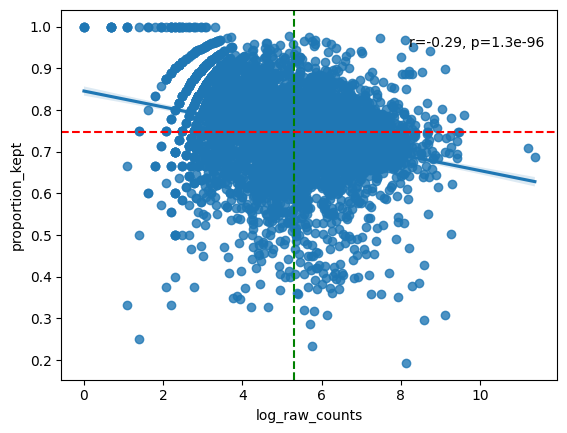

2026-05-26 08:05:26.279 | INFO     | harpy.qc._qc_transcripts:analyse_genes_left_out:183 - The ten genes with the highest proportion of transcripts filtered out in the region of interest ([x_min,x_max,y_min,y_max]=(12000, 16000, 21000, 25000)):
          proportion_kept  raw_counts
MYH11            0.193671        3413
PLN              0.234177         316
HPV16-E7         0.250000           4
SYNPO2           0.286667         300
LUM              0.295647        5307
BGN              0.307556        9026
HOPX             0.308696         460
SFRP4            0.318318         333
COL10A1          0.320312         256
NEXN             0.326923         104


In [56]:
# Analyse and visualize the proportion of transcripts that could not be assigned to a cell during allocation step.
df_analyse_genes_left_out = hp.qc.analyse_genes_left_out(
    sdata,
    labels_name="nucleus_segmentation_mask",
    table_name="table_transcriptomics",
    points_name="transcripts_global",
)

# NOTE: In general we see a downward trend. The more a gene is measured, the less it is located in cells (in ratio).
# NOTE: The function also prints the ten genes with the highest proportion of transcripts filtered out. If a lot of these genes are markers for the same cell type, you will want to find out why this is happening (bad staining, large cell body compared to nucleus, etc.)

In [57]:
# Inspect analyse_genes_left_out() output table
df_analyse_genes_left_out.sort_values(by="proportion_kept", ascending=True)

,proportion_kept,raw_counts,log_raw_counts
MYH11,0.193671,3413,8.135347
PLN,0.234177,316,5.755742
HPV16-E7,0.250000,4,1.386294
SYNPO2,0.286667,300,5.703782
LUM,0.295647,5307,8.576782
...,...,...,...
SSX4,1.000000,10,2.302585
PCDH11X,1.000000,5,1.609438
CDHR2,1.000000,12,2.484907
NLRP6,1.000000,9,2.197225


### 8.4 Comparing Xenium and Harpy allocation
Xenium already allocated transcripts to their segmentation masks and this data was read in using the Xenium reader. In principle, we would not need to repeat this step. However, below, we will redo the allocation and compare the results to the Xenium allocation. We generally would recommend to redo the allocation for Xenium using Harpy's implementation.

In [58]:
sdata = hp.tb.allocate(
    sdata=sdata,
    labels_name="cell_labels_global",  # we use the segmentation mask from Xenium
    points_name="transcripts_global",
    output_table_name="table_global_harpy",
    overwrite=True,
)

2026-05-26 08:05:26.318 | INFO     | harpy.table._allocation:_aggregate:494 - Calculating cell counts.


In [59]:
# AnnData table from Xenium transcript allocation
sdata.tables["table_global"]

AnnData object with n_obs × n_vars = 6079 × 5101
    obs: 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'fov_labels', 'z_level', 'cell_ID'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatialdata_attrs'
    obsm: 'spatial'

In [60]:
# AnnData table from Harpy transcript allocation
sdata.tables["table_global_harpy"]

AnnData object with n_obs × n_vars = 6072 × 5101
    obs: 'cell_ID', 'fov_labels'
    uns: 'spatialdata_attrs'
    obsm: 'spatial'

In [61]:
# Obs layer from Xenium transcript allocation
sdata.tables["table_global"].obs.head()

,transcript_counts,control_probe_counts,genomic_control_counts,control_codeword_counts,unassigned_codeword_counts,deprecated_codeword_counts,total_counts,cell_area,nucleus_area,nucleus_count,segmentation_method,fov_labels,z_level,cell_ID
cell_id,,,,,,,,,,,,,,
36736,102,0,0,0,0,20,122,53.058596,29.261251,1.0,Segmented by boundary stain (ATP1A1+CD45+E-Cad...,cell_labels_global,0.0,36736
36755,1023,0,0,0,0,115,1138,162.427037,122.147661,1.0,Segmented by boundary stain (ATP1A1+CD45+E-Cad...,cell_labels_global,0.0,36755
36756,341,0,0,0,0,34,375,47.459220,29.622501,1.0,Segmented by boundary stain (ATP1A1+CD45+E-Cad...,cell_labels_global,0.0,36756
36757,540,0,0,0,0,70,610,86.519378,67.418284,1.0,Segmented by boundary stain (ATP1A1+CD45+E-Cad...,cell_labels_global,0.0,36757
36762,435,0,0,0,0,5,440,58.522502,41.905002,1.0,Segmented by boundary stain (ATP1A1+CD45+E-Cad...,cell_labels_global,0.0,36762


In [62]:
# Obs layer from Harpy transcript allocation
sdata["table_global_harpy"].obs.head()

,cell_ID,fov_labels
cells,,
36736_cell_labels_global_5064219f,36736,cell_labels_global
36755_cell_labels_global_5064219f,36755,cell_labels_global
36756_cell_labels_global_5064219f,36756,cell_labels_global
36757_cell_labels_global_5064219f,36757,cell_labels_global
36762_cell_labels_global_5064219f,36762,cell_labels_global


In [63]:
# Compare the number of transcripts allocated to the cell with ID 45024, in the allocation done by Xenium versus the one done by Harpy
cell_ID = 45024

idx_xenium = sdata.tables["table_global"].obs.index[
    sdata.tables["table_global"].obs["cell_ID"] == cell_ID
][0]
idx_sparrow = sdata.tables["table_global_harpy"].obs.index[
    sdata.tables["table_global_harpy"].obs["cell_ID"] == cell_ID
][0]

print("Xenium:", sdata.tables["table_global"][idx_xenium].X.sum(), "transcripts")
print("Harpy:", sdata.tables["table_global_harpy"][idx_sparrow].X.sum(), "transcripts")

# NOTE: We get less transcripts for Xenium's allocation than for Harpy's allocation.

Xenium: 277.0 transcripts
Harpy: 317 transcripts


In [64]:
# Show the counts for genes assigned to cell with ID 36736 by Harpy
sdata.tables["table_global_harpy"][idx_sparrow].to_df().T.sort_values(
    by=idx_sparrow, ascending=False
).head(n=10)

cells,45024_cell_labels_global_5064219f
H19,15
EEF1G,8
PLXNB1,6
UCHL1,5
MYL9,5
SRSF1,3
NORAD,3
ARHGEF2,2
SQSTM1,2
BCAM,2


In [65]:
# # Show the counts for genes assigned to cell with ID 45024 by Xenium
sdata.tables["table_global"][idx_xenium].to_df().T.sort_values(
    by=idx_xenium, ascending=False
).head(n=10)

cell_id,45024
H19,14.0
EEF1G,7.0
UCHL1,5.0
PLXNB1,5.0
MYL9,5.0
NORAD,3.0
SRSF1,3.0
BCAM,2.0
CHD7,2.0
CTNNA1,2.0


In [66]:
# We can extract the obs information for a specific cell of interest like this:
sdata["table_global_harpy"][idx_sparrow].obs

,cell_ID,fov_labels
cells,,
45024_cell_labels_global_5064219f,45024,cell_labels_global


In [67]:
# And we can get the cell's (x,y) location in image coordinates
coords = sdata["table_global_harpy"][idx_sparrow].obsm["spatial"][0]
x = int(coords[0])
y = int(coords[1])

print(f"Cell with ID {cell_ID} is located at coordinates: ({x}, {y})")

Cell with ID 45024 is located at coordinates: (12063, 22602)


2026-05-26 08:05:28.572 | INFO     | harpy.plot._sanity:sanity:254 - Plotting 63 transcripts.
2026-05-26 08:05:28.573 | INFO     | harpy.plot._sanity:sanity:269 - Selecting boundaries
2026-05-26 08:05:28.577 | INFO     | harpy.plot._sanity:sanity:306 - Plotting boundaries
2026-05-26 08:05:28.600 | INFO     | harpy.plot._sanity:sanity:314 - End plotting boundaries


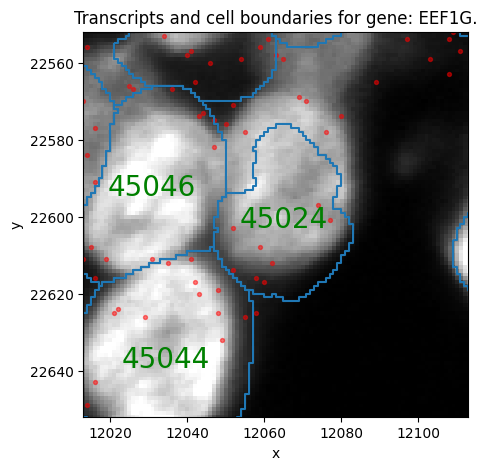

In [68]:
# Plot a close-up of the cell with ID 45024, and the transcripts for gene "EEF1G" to confirm that there are indeed 8 transcripts inside the cell
hp.pl.sanity(
    sdata,
    image_name="morphology_focus_global",
    shapes_name="cell_shapes_global",
    points_name="transcripts_global",
    plot_cell_number=True,
    gene="EEF1G",
    crd=[x - 50, x + 50, y - 50, y + 50],
    figsize=(5, 5),
)

In [69]:
from napari_harpy import Interactive

Interactive(sdata, widgets="viewer")

In [70]:
# Let's clean up the table layer since we don't need it anymore
#  ( we will proceed with the table "table_transcriptomics", created using the segmentation mask "nucleus_segmentation_mask" )
del sdata.tables["table_global_harpy"]
sdata.delete_element_from_disk("table_global_harpy")

## 9. Processing the AnnData table

### 9.1 Filtering and Normalization

The next steps are performed to further process the AnnData object:

- QC metrics are calculated.
- Filtering: cells with fewer than a certain amount of counts (e.g. 10) and genes occuring in fewer than a certain amount of cells (e.g. 5) are filtered out.
- Normalization: for small gene panels (<500), we recommend to normalize the data based on the size of the segmented object (`size_norm=True`). For transcriptome-wide methods, we recommend library size normalization based on the total expression (`size_norm=False`). 
- log1p-transformation of the expression data (y=ln(1+x)).
- Scale data to unit variance and zero mean. The scaling is capped at `max_value_scale`.
- PCA calculation

In [71]:
# Perform preprocessing.
# Takes around 7 minutes on gp_64C_128T_512GB partition of VIB compute, using 32 tasks per node (salloc --partition=gp_64C_128T_512GB --ntasks-per-node=32 --mem=128G --time=08:00:00).
sdata = hp.tb.preprocess_transcriptomics(
    sdata,
    labels_name="nucleus_segmentation_mask",
    table_name="table_transcriptomics",
    output_table_name="table_transcriptomics_preprocessed",  # write results to a new slot, we could also write to the same slot (when passing overwrite==True).
    min_counts=10,
    min_cells=5,
    size_norm=False,
    library_norm=True,
    highly_variable_genes=False,  # If True, will only retain highly variable genes. This can be used for transcriptome-wide methods.
    max_value_scale=10,  # The maximum value to which data will be scaled
    n_comps=50,  # Number of principal components to calculate.
    overwrite=True,
    update_shapes_elements=False,
)

2026-05-26 08:05:31.042 | INFO     | harpy.table._preprocess:preprocess:318 - Calculating cell size from provided labels_name 'nucleus_segmentation_mask'
2026-05-26 08:05:31.176 | INFO     | harpy.table._preprocess:preprocess:338 - Saving non preprocessed data matrix to the AnnData '.layers[raw_counts]'.


In [72]:
# Inspect preprocessed table
sdata.tables["table_transcriptomics_preprocessed"]

AnnData object with n_obs × n_vars = 5781 × 5067
    obs: 'cell_ID', 'fov_labels', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_2_genes', 'pct_counts_in_top_5_genes', 'n_counts', 'shapeSize'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'mean', 'std'
    uns: 'pca', 'log1p', 'spatialdata_attrs'
    obsm: 'X_pca', 'spatial'
    varm: 'PCs'
    layers: 'raw_counts'

In [73]:
# Inspect expression values
sdata.tables["table_transcriptomics_preprocessed"].to_df().head()

,A2ML1,AAMP,AAR2,AARSD1,ABAT,ABCA1,ABCA10,ABCA3,ABCA4,ABCA7,...,ZPR1,ZSCAN1,ZSCAN12,ZSCAN16,ZSCAN20,ZSCAN26,ZSWIM6,ZUP1,ZYG11B,ZYX
cells,,,,,,,,,,,,,,,,,,,,,
1039_nucleus_segmentation_mask_345aa67d,-0.053466,-0.351097,-0.232044,-0.185528,-0.091897,-0.280446,-0.153907,-0.081919,-0.078417,-0.084083,...,-0.219543,-0.057505,-0.127242,-0.16895,-0.119185,-0.139335,-0.130738,-0.121845,-0.204363,-0.216464
1071_nucleus_segmentation_mask_345aa67d,-0.053466,-0.351097,-0.232044,-0.185528,-0.091897,-0.280446,-0.153907,-0.081919,-0.078417,-0.084083,...,-0.219543,-0.057505,-0.127242,-0.16895,-0.119185,-0.139335,-0.130738,-0.121845,-0.204363,-0.216464
1135_nucleus_segmentation_mask_345aa67d,-0.053466,-0.351097,-0.232044,-0.185528,-0.091897,2.226875,7.952601,-0.081919,-0.078417,-0.084083,...,-0.219543,-0.057505,-0.127242,-0.16895,-0.119185,-0.139335,-0.130738,-0.121845,-0.204363,-0.216464
1167_nucleus_segmentation_mask_345aa67d,-0.053466,-0.351097,-0.232044,-0.185528,-0.091897,-0.280446,-0.153907,-0.081919,-0.078417,-0.084083,...,5.070987,-0.057505,-0.127242,-0.16895,-0.119185,-0.139335,-0.130738,-0.121845,-0.204363,-0.216464
1199_nucleus_segmentation_mask_345aa67d,-0.053466,-0.351097,-0.232044,-0.185528,-0.091897,-0.280446,-0.153907,-0.081919,-0.078417,-0.084083,...,-0.219543,-0.057505,-0.127242,-0.16895,-0.119185,-0.139335,-0.130738,-0.121845,-0.204363,-0.216464


In [74]:
# Check mean expression values per gene
sdata.tables["table_transcriptomics_preprocessed"].to_df().mean(
    axis=0
).head()  # mean ~ 0

A2ML1    -1.666880e-02
AAMP      6.693602e-16
AAR2     -8.229516e-04
AARSD1   -3.457074e-03
ABAT     -1.154164e-02
dtype: float64

In [75]:
# Check standard deviation of expression values per gene
sdata.tables["table_transcriptomics_preprocessed"].to_df().std(axis=0).head()  # std ~ 1

A2ML1     0.580889
AAMP      1.000000
AAR2      0.990979
AARSD1    0.955663
ABAT      0.815348
dtype: float64

In [76]:
# Check max expression value per gene
sdata.tables["table_transcriptomics_preprocessed"].to_df().max(
    axis=0
).head()  # max ~ 10

A2ML1     10.000000
AAMP       9.265311
AAR2      10.000000
AARSD1    10.000000
ABAT      10.000000
dtype: float64

In [77]:
# Inspect obs of preprocessed table
sdata.tables["table_transcriptomics_preprocessed"].obs.head()

# n_genes_by_counts: The number of genes with at least 1 count in a cell
# log1p_n_genes_by_counts: log1p-transformed n_genes_by_counts
# total_counts: Total number of counts for a cell
# log1p_total_counts: log1p-transformed total_counts
# pct_counts_in_top_2_genes: The percentage of the total gene expression in each cell that comes from the top 2 most highly expressed genes in that cell
# pct_counts_in_top_5_genes: The percentage of the total gene expression in each cell that comes from the top 5 most highly expressed genes in that cell
# n_counts: Number of counts in a cell
# shapeSize: Area of cell (in pixels)

,cell_ID,fov_labels,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_2_genes,pct_counts_in_top_5_genes,n_counts,shapeSize
cells,,,,,,,,,,
1039_nucleus_segmentation_mask_345aa67d,1039,nucleus_segmentation_mask,168,5.129899,218,5.389072,7.339450,12.844037,218,2289.0
1071_nucleus_segmentation_mask_345aa67d,1071,nucleus_segmentation_mask,312,5.746203,414,6.028279,3.864734,7.487923,414,1884.0
1135_nucleus_segmentation_mask_345aa67d,1135,nucleus_segmentation_mask,220,5.398163,305,5.723585,5.245902,10.819672,305,2185.0
1167_nucleus_segmentation_mask_345aa67d,1167,nucleus_segmentation_mask,190,5.252273,239,5.480639,9.623431,14.644351,239,2062.0
1199_nucleus_segmentation_mask_345aa67d,1199,nucleus_segmentation_mask,106,4.672829,118,4.779123,5.932203,11.864407,118,1027.0


In [78]:
# Inspect var of preprocessed table
sdata.tables["table_transcriptomics_preprocessed"].var.head()

# n_cells_by_counts: Number of cells this gene is found in
# mean_counts: Mean counts over all cells
# log1p_mean_counts: log1p of mean_counts
# pct_drop_by_counts: Percentage of cells this gene does not appear in
# total_counts: Total number of counts for a gene
# logp_total_counts: log1p of total_counts
# n_cells: Number of cells this gene is found in
# mean:
# std:

,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts,n_cells,mean,std
A2ML1,24,0.004098,0.004089,99.590234,24,3.218876,24,0.002926,0.054720
AAMP,770,0.155199,0.144273,86.853338,909,6.813445,769,0.081024,0.230773
AAR2,353,0.067611,0.065424,93.973024,396,5.983936,353,0.036414,0.156926
AARSD1,241,0.046269,0.045231,95.885265,271,5.605802,241,0.024448,0.131776
ABAT,58,0.010244,0.010192,99.009732,60,4.110874,58,0.005865,0.063824


In [79]:
sdata.tables["table_transcriptomics_preprocessed"].obs.head()

,cell_ID,fov_labels,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_2_genes,pct_counts_in_top_5_genes,n_counts,shapeSize
cells,,,,,,,,,,
1039_nucleus_segmentation_mask_345aa67d,1039,nucleus_segmentation_mask,168,5.129899,218,5.389072,7.339450,12.844037,218,2289.0
1071_nucleus_segmentation_mask_345aa67d,1071,nucleus_segmentation_mask,312,5.746203,414,6.028279,3.864734,7.487923,414,1884.0
1135_nucleus_segmentation_mask_345aa67d,1135,nucleus_segmentation_mask,220,5.398163,305,5.723585,5.245902,10.819672,305,2185.0
1167_nucleus_segmentation_mask_345aa67d,1167,nucleus_segmentation_mask,190,5.252273,239,5.480639,9.623431,14.644351,239,2062.0
1199_nucleus_segmentation_mask_345aa67d,1199,nucleus_segmentation_mask,106,4.672829,118,4.779123,5.932203,11.864407,118,1027.0


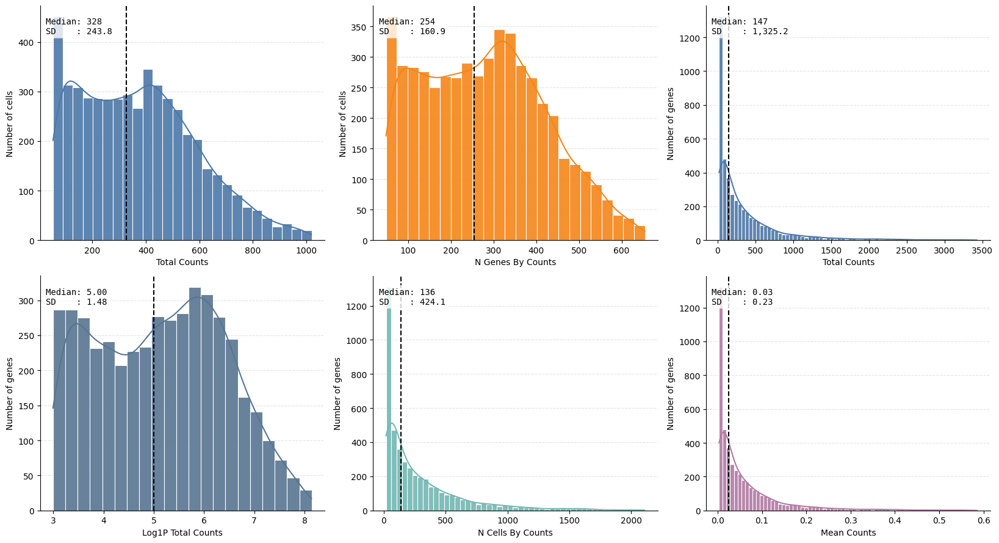

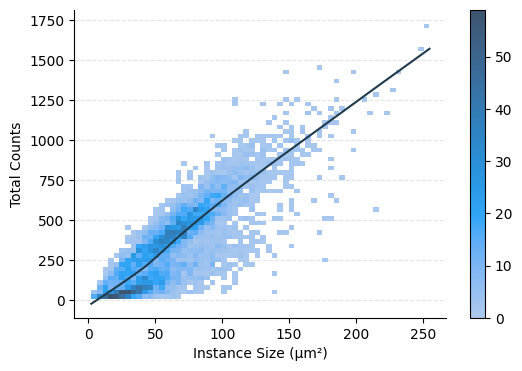

In [80]:
ax = hp.qc.metrics_histogram(
    sdata, table_name="table_transcriptomics_preprocessed", quantile_range=(0.1, 0.99)
)

sdata["table_transcriptomics_preprocessed"].obs["shapeSize_microns"] = sdata[
    "table_transcriptomics_preprocessed"
].obs["shapeSize"] * (microns_per_pixel**2)

ax = hp.qc.obs_scatter(
    sdata,
    table_name="table_transcriptomics_preprocessed",
    column_y="total_counts",
    column_x="shapeSize_microns",
    display_column_x="Instance Size (μm²)",
)


<Axes: title={'center': 'Total counts'}>

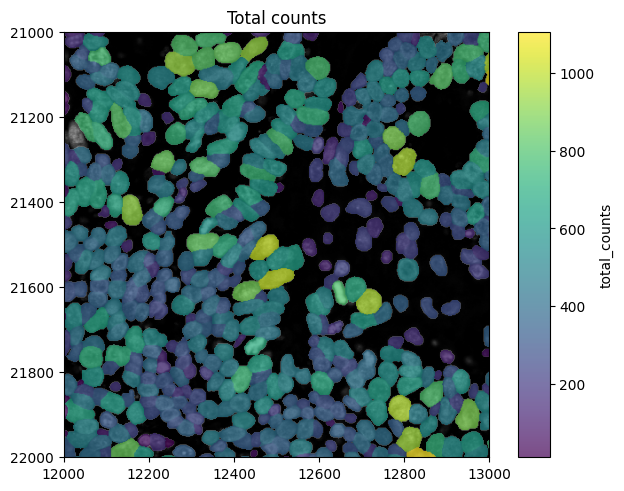

In [81]:
# Plot total counts spatially
xmin = 12000
xmax = 16000
ymin = 21000
ymax = 25000

hp.pl.plot_sdata(
    sdata,
    image_name="clahe",
    channel="DAPI",
    table_name="table_transcriptomics_preprocessed",
    labels_name="nucleus_segmentation_mask",
    color="total_counts",
    crd=(min_x, max_x, min_y, max_y),
    to_coordinate_system="global",
    render_images_kwargs={"cmap": "grey", "colorbar": False},
    render_labels_kwargs={"fill_alpha": 0.7, "colorbar": True},
    show_kwargs={"title": "Total counts"},
)

<Axes: title={'center': 'Segmentation mask areas'}>

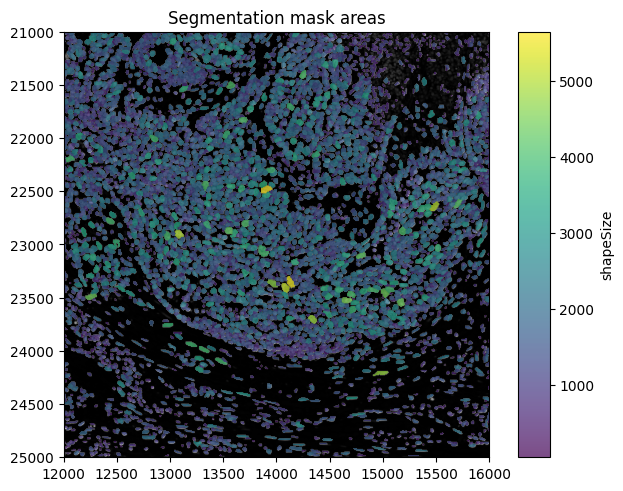

In [82]:
# Plot segmentation mask areas spatially
hp.pl.plot_sdata(
    sdata,
    image_name="clahe",
    channel="DAPI",
    table_name="table_transcriptomics_preprocessed",
    labels_name="nucleus_segmentation_mask",
    color="shapeSize",
    # crd=(min_x, max_x, min_y, max_y),
    to_coordinate_system="global",
    render_images_kwargs={"cmap": "grey", "colorbar": False},
    render_labels_kwargs={"fill_alpha": 0.7, "colorbar": True},
    show_kwargs={"title": "Segmentation mask areas"},
)

In [83]:
sdata.tables["table_transcriptomics_preprocessed"].obs[
    "shapeSize"
].describe()  # -> in pixels!

count    5781.000000
mean     1396.402344
std       712.564697
min        47.000000
25%       868.000000
50%      1322.000000
75%      1823.000000
max      5649.000000
Name: shapeSize, dtype: float64

In [84]:
# Filter cells on size
sdata = hp.tb.filter_on_size(
    sdata,
    labels_name="nucleus_segmentation_mask",
    table_name="table_transcriptomics_preprocessed",
    output_table_name="table_transcriptomics_preprocessed",
    min_size=500,  # Minimum cell size # in pixels!
    max_size=4200,  # Maximum cell size
    update_shapes_elements=False,  # Be careful with setting this to True, it might filter cells from shapes layers that you don't want to filter ! Parameter is deprecated, and will be removed in future versions of Harpy.
    overwrite=True,
)

2026-05-26 08:05:49.783 | WARNING  | harpy.utils._io:_incremental_io_on_disk:86 - Element with name 'table_transcriptomics_preprocessed' already exists. Overwriting...
2026-05-26 08:05:51.817 | INFO     | harpy.table._table:filter_on_size:318 - 482 cells were filtered out based on size.


<Axes: title={'center': 'Segmentation mask areas'}>

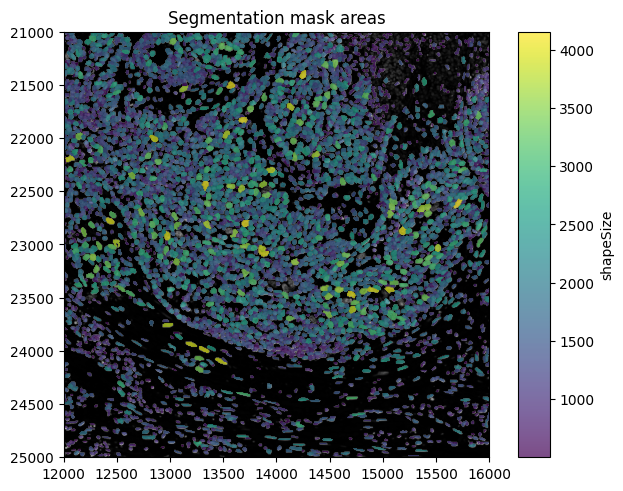

In [85]:
# Plot segmentation mask areas spatially
hp.pl.plot_sdata(
    sdata,
    image_name="clahe",
    channel="DAPI",
    table_name="table_transcriptomics_preprocessed",
    labels_name="nucleus_segmentation_mask",
    color="shapeSize",
    # crd=(min_x, max_x, min_y, max_y),
    to_coordinate_system="global",
    render_images_kwargs={"cmap": "grey", "colorbar": False},
    render_labels_kwargs={"fill_alpha": 0.7, "colorbar": True},
    show_kwargs={"title": "Segmentation mask areas"},
)

### 9.2 Clustering

This function performs the neighborhood analysis and the leiden clustering and the UMAP calculations using standard scanpy functions.

You need to define the following parameters:
- The amount of PC's used: Between 15-20 is a good starting point (based on the plot of PCs).
- The amount of neighbors used: 35 is generally a good value. In general, less neighbors means more spread, more means everything is tighter.
- Cluster resolution.

It returns the UMAP and marker gene list per cluster, that can be looked at for finding celltypes. 

2026-05-26 08:06:11.948 | WARNING  | harpy.utils._io:_incremental_io_on_disk:86 - Element with name 'table_transcriptomics_preprocessed' already exists. Overwriting...


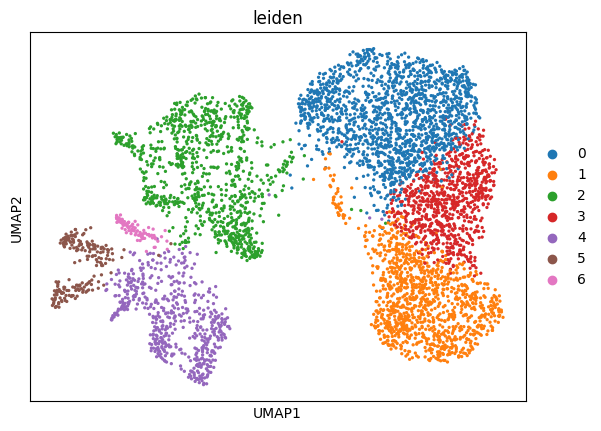

In [86]:
# Leiden clustering
sdata = hp.tb.leiden(
    sdata,
    labels_name="nucleus_segmentation_mask",
    table_name="table_transcriptomics_preprocessed",
    output_table_name="table_transcriptomics_preprocessed",
    calculate_umap=True,
    calculate_neighbors=True,
    n_pcs=17,  # The number of principal components to use when calculating neighbors.
    n_neighbors=35,  # The number of neighbors to consider when calculating neighbors.
    resolution=0.4,
    rank_genes=True,
    key_added="leiden",
    overwrite=True,
)

# Plot UMAP
sc.pl.umap(
    sdata.tables["table_transcriptomics_preprocessed"], color=["leiden"], show=True
)

<Axes: title={'center': 'Leiden clusters'}>

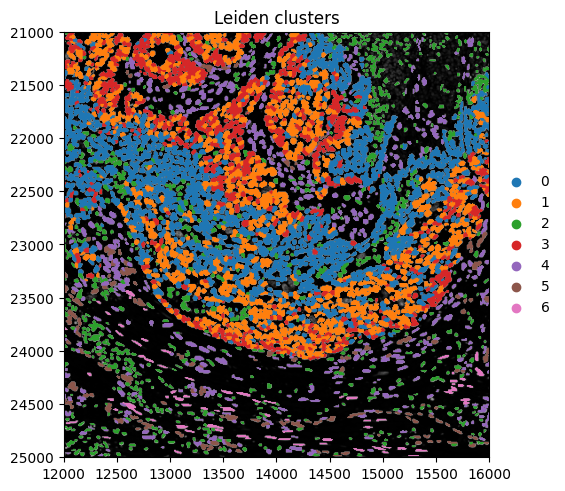

In [87]:
# Plot clusters spatially
hp.pl.plot_sdata(
    sdata,
    image_name="clahe",
    channel="DAPI",
    table_name="table_transcriptomics_preprocessed",
    labels_name="nucleus_segmentation_mask",
    color="leiden",
    # crd=(min_x, max_x, min_y, max_y),
    to_coordinate_system="global",
    render_images_kwargs={"cmap": "grey"},
    render_labels_kwargs={"fill_alpha": 1},
    show_kwargs={"title": "Leiden clusters", "colorbar": False},
)

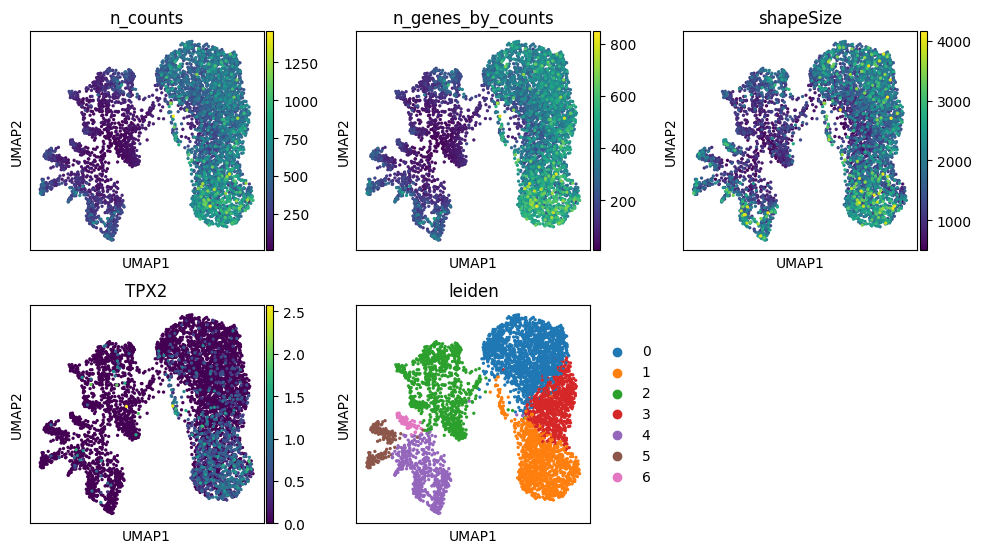

In [88]:
# We can plot other variables on the UMAP as well
from matplotlib.pyplot import rc_context

color_vars = [
    "n_counts",
    "n_genes_by_counts",
    "shapeSize",
    "TPX2",
    "leiden",
]
with rc_context({"figure.figsize": (3, 3)}):
    sc.pl.umap(
        sdata.tables["table_transcriptomics_preprocessed"], color=color_vars, ncols=3
    )

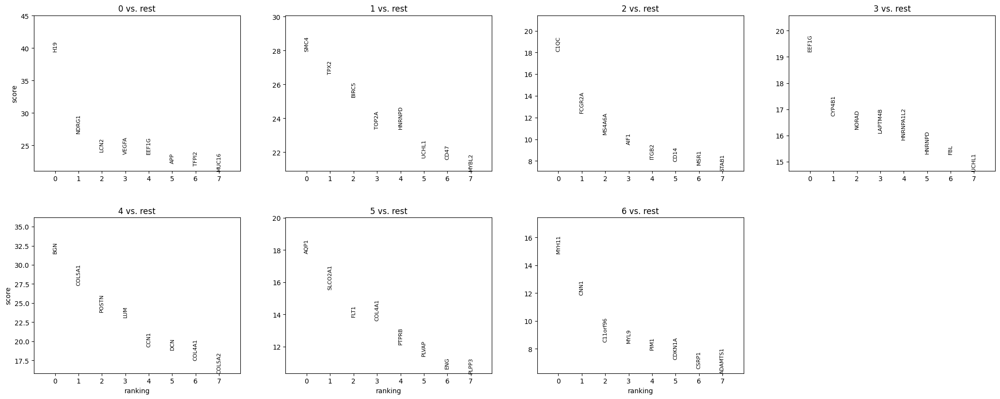

In [89]:
sc.pl.rank_genes_groups(
    sdata.tables["table_transcriptomics_preprocessed"],
    n_genes=8,
    sharey=False,
    show=True,
)